# FLIR Slice-Binning Study Notebook

This notebook studies two alternative slice definitions for the FLIR proxy alignment training split:

1. `global` size bins
2. `class_conditioned` size bins

The workflow is deliberately notebook-first and analysis-oriented:

- inspect the real dataset layout before loading anything,
- build an instance-centered table with explicit derived columns,
- compare the full training-set slice structure under both size-binning strategies,
- construct two same-budget subsets under one selected strategy,
- and re-visualize the subsets to verify that the balanced subset is broader and the unbalanced subset is more concentrated.

The notebook assumes a repo-aware analysis environment such as:

```bash
conda run -n diffusers-dev jupyter lab
```


In [1]:
from __future__ import annotations

import math
import random
import sys
import warnings
from collections import Counter
from pathlib import Path

import matplotlib.patches as patches
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
from IPython.display import Markdown, display


def _resolve_repo_root() -> Path:
    try:
        from src.core.paths import repo_root as _repo_root

        return _repo_root()
    except Exception:
        start = Path.cwd().resolve()
        for candidate in [start, *start.parents]:
            if (candidate / 'pyproject.toml').exists() and (candidate / 'src').exists():
                return candidate
        raise RuntimeError('Could not resolve repository root from the current environment.')


REPO_ROOT = _resolve_repo_root()
if str(REPO_ROOT) not in sys.path:
    sys.path.insert(0, str(REPO_ROOT))

from src.analysis.flir_subgroup.data import (
    inspect_dataset_root,
    load_dataset_tables,
    load_image_array,
    normalize_for_display,
)


SEED = 7
DATASET_ROOT = REPO_ROOT / 'data' / 'raw' / 'v18'
TRAIN_SPLIT = 'train'
TEST_SPLIT = 'test'
SIZE_BIN_STRATEGY = 'global'
SUBSET_NUM_IMAGES = 2000
POSITION_GRID_SIZE = (3, 3)
TOP_K_SLICES = 10
RARE_SLICE_THRESHOLDS = (2, 5, 10)
MIN_CLASS_INSTANCES_FOR_LOCAL_QUANTILES = 30

assert SIZE_BIN_STRATEGY in {'global', 'class_conditioned'}
assert POSITION_GRID_SIZE == (3, 3), 'This notebook currently implements a 3x3 position grid.'

SIZE_BIN_ORDER = ['small', 'medium', 'large']
POSITION_BIN_ORDER = [
    'top_left', 'top_center', 'top_right',
    'middle_left', 'middle_center', 'middle_right',
    'bottom_left', 'bottom_center', 'bottom_right',
]
POSITION_ROW_LABELS = ['top', 'middle', 'bottom']
POSITION_COL_LABELS = ['left', 'center', 'right']

random.seed(SEED)
np.random.seed(SEED)
rng = np.random.default_rng(SEED)

plt.style.use('default')
sns.set_theme(style='whitegrid', context='notebook')
plt.rcParams['figure.dpi'] = 120
plt.rcParams['axes.titlesize'] = 12
plt.rcParams['axes.labelsize'] = 10
plt.rcParams['figure.figsize'] = (10, 6)
pd.set_option('display.max_columns', 80)
pd.set_option('display.max_rows', 200)
pd.set_option('display.width', 140)

display(
    Markdown(
        '\n'.join(
            [
                '## 1. Setup and configuration',
                '',
                f'- `REPO_ROOT`: `{REPO_ROOT}`',
                f'- `DATASET_ROOT`: `{DATASET_ROOT}`',
                f'- `TRAIN_SPLIT`: `{TRAIN_SPLIT}`',
                f'- `TEST_SPLIT`: `{TEST_SPLIT}`',
                f'- `SIZE_BIN_STRATEGY`: `{SIZE_BIN_STRATEGY}`',
                f'- `SUBSET_NUM_IMAGES`: `{SUBSET_NUM_IMAGES}`',
                f'- `POSITION_GRID_SIZE`: `{POSITION_GRID_SIZE}`',
                f'- `TOP_K_SLICES`: `{TOP_K_SLICES}`',
                f'- `RARE_SLICE_THRESHOLDS`: `{RARE_SLICE_THRESHOLDS}`',
                f'- `MIN_CLASS_INSTANCES_FOR_LOCAL_QUANTILES`: `{MIN_CLASS_INSTANCES_FOR_LOCAL_QUANTILES}`',
                f'- `SEED`: `{SEED}`',
            ]
        )
    )
)


## 1. Setup and configuration

- `REPO_ROOT`: `/projets/Fbassignana/diffusers_try/flow_matching_trial`
- `DATASET_ROOT`: `/projets/Fbassignana/diffusers_try/flow_matching_trial/data/raw/v18`
- `TRAIN_SPLIT`: `train`
- `TEST_SPLIT`: `test`
- `SIZE_BIN_STRATEGY`: `global`
- `SUBSET_NUM_IMAGES`: `2000`
- `POSITION_GRID_SIZE`: `(3, 3)`
- `TOP_K_SLICES`: `10`
- `RARE_SLICE_THRESHOLDS`: `(2, 5, 10)`
- `MIN_CLASS_INSTANCES_FOR_LOCAL_QUANTILES`: `30`
- `SEED`: `7`

## 2. Dataset discovery and loading

The notebook first inspects the local dataset root and infers the real split layout and annotation paths.
Nothing in this section assumes a hard-coded filename beyond the dataset root itself.


In [2]:
dataset_layout_df, root_metadata_df = inspect_dataset_root(DATASET_ROOT)
dataset_layout_df = dataset_layout_df.sort_values('split').reset_index(drop=True)
root_metadata_df = root_metadata_df.reset_index(drop=True)

display(Markdown('### Discovered dataset layout'))
display(dataset_layout_df)

if not root_metadata_df.empty:
    display(Markdown('### Root-level metadata files'))
    display(root_metadata_df)
else:
    print('No root-level metadata*.jsonl files were discovered.')

for required_split in [TRAIN_SPLIT, TEST_SPLIT]:
    if required_split not in set(dataset_layout_df['split']):
        raise ValueError(f'Requested split {required_split!r} was not discovered under {DATASET_ROOT}.')

train_split_record = dataset_layout_df.loc[dataset_layout_df['split'] == TRAIN_SPLIT].iloc[0]
test_split_record = dataset_layout_df.loc[dataset_layout_df['split'] == TEST_SPLIT].iloc[0]

train_image_df, train_instance_df, category_table = load_dataset_tables(dataset_layout_df, selected_splits=[TRAIN_SPLIT])
test_image_df, test_instance_df, test_category_table = load_dataset_tables(dataset_layout_df, selected_splits=[TEST_SPLIT])

train_image_df = train_image_df.copy().sort_values('image_id').reset_index(drop=True)
train_instance_df = train_instance_df.copy().sort_values(['image_id', 'ann_id']).reset_index(drop=True)
test_image_df = test_image_df.copy().sort_values('image_id').reset_index(drop=True)
test_instance_df = test_instance_df.copy().sort_values(['image_id', 'ann_id']).reset_index(drop=True)
category_table = category_table.copy().sort_values('class_id').reset_index(drop=True)
test_category_table = test_category_table.copy().sort_values('class_id').reset_index(drop=True)
class_order = category_table['class_label'].tolist()

class_distribution_df = (
    train_instance_df['class_label']
    .value_counts()
    .rename_axis('class_label')
    .reset_index(name='n_instances')
)
class_distribution_df['share'] = class_distribution_df['n_instances'] / class_distribution_df['n_instances'].sum()

test_class_distribution_df = (
    test_instance_df['class_label']
    .value_counts()
    .rename_axis('class_label')
    .reset_index(name='n_instances')
)
test_class_distribution_df['share'] = test_class_distribution_df['n_instances'] / test_class_distribution_df['n_instances'].sum()

assumptions = [
    f"Training split resolved to `{train_split_record['split_dir']}`.",
    f"Original test split resolved to `{test_split_record['split_dir']}`.",
    f"Training annotations were loaded from `{train_split_record['annotation_path']}`.",
    f"Test annotations were loaded from `{test_split_record['annotation_path']}`.",
    'Image references were resolved via the repo-aware split inspection helper.',
    'The dataset uses one COCO-style annotation file per split.',
    'Images are stored as `.npy` arrays and are previewed after intensity normalization.',
    'Slice analysis is instance-centered: one object annotation equals one slice assignment.',
]

display(
    Markdown(
        '\n'.join(
            [
                '### Training split summary',
                '',
                f'- Number of training images: **{train_image_df["image_id"].nunique():,}**',
                f'- Number of annotated instances: **{len(train_instance_df):,}**',
                f'- Number of classes: **{len(category_table):,}**',
                f'- Missing referenced image files: **{int((~train_image_df["image_exists"]).sum()):,}**',
                '',
                '### Original test split summary',
                '',
                f'- Number of test images: **{test_image_df["image_id"].nunique():,}**',
                f'- Number of annotated instances: **{len(test_instance_df):,}**',
                f'- Number of classes: **{len(test_category_table):,}**',
                f'- Missing referenced image files: **{int((~test_image_df["image_exists"]).sum()):,}**',
                '',
                '### Parsing assumptions',
                '',
                *[f'- {item}' for item in assumptions],
            ]
        )
    )
)

display(Markdown('### Training category table'))
display(category_table)

display(Markdown('### Test category table'))
display(test_category_table)

display(Markdown('### Class distribution on the training split'))
display(class_distribution_df)

display(Markdown('### Class distribution on the original test split'))
display(test_class_distribution_df)


### Discovered dataset layout

,split,split_dir,annotation_path,captions_path,n_images_json,n_annotations_json,n_categories,category_names,n_image_files_disk,image_extensions,n_missing_referenced_images
0,images,/projets/Fbassignana/diffusers_try/flow_matchi...,/projets/Fbassignana/diffusers_try/flow_matchi...,None,6725,16822,1,person,6725,.npy,0
1,test,/projets/Fbassignana/diffusers_try/flow_matchi...,/projets/Fbassignana/diffusers_try/flow_matchi...,None,799,2026,1,person,799,.npy,0
2,train,/projets/Fbassignana/diffusers_try/flow_matchi...,/projets/Fbassignana/diffusers_try/flow_matchi...,/projets/Fbassignana/diffusers_try/flow_matchi...,6725,16822,1,person,6725,.npy,0
3,val,/projets/Fbassignana/diffusers_try/flow_matchi...,/projets/Fbassignana/diffusers_try/flow_matchi...,None,2289,5947,1,person,188,.npy,2101


### Root-level metadata files

,path,n_preview_rows,preview_columns
0,/projets/Fbassignana/diffusers_try/flow_matchi...,1,"file_name, text"


### Training split summary

- Number of training images: **6,725**
- Number of annotated instances: **16,822**
- Number of classes: **1**
- Missing referenced image files: **0**

### Original test split summary

- Number of test images: **799**
- Number of annotated instances: **2,026**
- Number of classes: **1**
- Missing referenced image files: **0**

### Parsing assumptions

- Training split resolved to `/projets/Fbassignana/diffusers_try/flow_matching_trial/data/raw/v18/train`.
- Original test split resolved to `/projets/Fbassignana/diffusers_try/flow_matching_trial/data/raw/v18/test`.
- Training annotations were loaded from `/projets/Fbassignana/diffusers_try/flow_matching_trial/data/raw/v18/train/annotations.json`.
- Test annotations were loaded from `/projets/Fbassignana/diffusers_try/flow_matching_trial/data/raw/v18/test/annotations.json`.
- Image references were resolved via the repo-aware split inspection helper.
- The dataset uses one COCO-style annotation file per split.
- Images are stored as `.npy` arrays and are previewed after intensity normalization.
- Slice analysis is instance-centered: one object annotation equals one slice assignment.

### Training category table

,split,class_id,class_label
0,train,0,person


### Test category table

,split,class_id,class_label
0,test,0,person


### Class distribution on the training split

,class_label,n_instances,share
0,person,16822,1.0


### Class distribution on the original test split

,class_label,n_instances,share
0,person,2026,1.0


## 3. Instance table construction

Next we extend the raw instance table with explicit geometry columns that are convenient for later slicing and plotting.
We also add a reusable image preview helper so that a few sanity-check examples can be inspected directly in the notebook.


In [3]:
def add_position_bin_columns(instance_df: pd.DataFrame) -> pd.DataFrame:
    df = instance_df.copy()
    x_norm = df['bbox_center_x_norm'].clip(0.0, 1.0)
    y_norm = df['bbox_center_y_norm'].clip(0.0, 1.0)

    x_idx = np.clip(np.floor(x_norm * 3.0).astype(int), 0, 2)
    y_idx = np.clip(np.floor(y_norm * 3.0).astype(int), 0, 2)

    df['position_col_bin'] = pd.Categorical([POSITION_COL_LABELS[idx] for idx in x_idx], categories=POSITION_COL_LABELS, ordered=True)
    df['position_row_bin'] = pd.Categorical([POSITION_ROW_LABELS[idx] for idx in y_idx], categories=POSITION_ROW_LABELS, ordered=True)
    df['position_bin'] = pd.Categorical(
        [POSITION_BIN_ORDER[row * 3 + col] for row, col in zip(y_idx, x_idx)],
        categories=POSITION_BIN_ORDER,
        ordered=True,
    )
    return df


def enrich_instance_table(instance_df: pd.DataFrame) -> pd.DataFrame:
    df = instance_df.copy()
    df['bbox_x2'] = df['bbox_x'] + df['bbox_w']
    df['bbox_y2'] = df['bbox_y'] + df['bbox_h']
    df['bbox_area_ratio'] = df['bbox_area'] / df['image_area']
    df = add_position_bin_columns(df)
    return df


def apply_class_conditioned_thresholds(
    instance_df: pd.DataFrame,
    thresholds_df: pd.DataFrame,
    *,
    global_q33: float,
    global_q67: float,
) -> tuple[pd.DataFrame, pd.DataFrame]:
    df = instance_df.copy()
    threshold_map = thresholds_df.set_index('class_label')[['q33_threshold', 'q67_threshold']].to_dict('index')

    applied_rows = []
    size_bin_labels = pd.Series(index=df.index, dtype='object')
    for class_label, group_df in df.groupby('class_label', sort=True):
        threshold_values = threshold_map.get(class_label)
        threshold_source = 'train_class_threshold'
        if threshold_values is None:
            q33, q67 = global_q33, global_q67
            threshold_source = 'train_global_fallback_missing_class'
        else:
            q33 = float(threshold_values['q33_threshold'])
            q67 = float(threshold_values['q67_threshold'])

        ratios = group_df['bbox_area_ratio'].astype(float)
        size_bin_labels.loc[group_df.index] = assign_bins_from_thresholds(ratios, q33, q67).astype(str)
        applied_rows.append(
            {
                'class_label': class_label,
                'n_instances': int(len(group_df)),
                'q33_threshold': q33,
                'q67_threshold': q67,
                'threshold_source': threshold_source,
            }
        )

    df['size_bin_class_conditioned'] = pd.Categorical(size_bin_labels, categories=SIZE_BIN_ORDER, ordered=True)
    applied_thresholds_df = pd.DataFrame(applied_rows).sort_values('class_label').reset_index(drop=True)
    return applied_thresholds_df, df


def assign_bins_from_thresholds(values: pd.Series, q33: float, q67: float) -> pd.Categorical:
    labels = np.select(
        [values <= q33, values <= q67],
        ['small', 'medium'],
        default='large',
    )
    return pd.Categorical(labels, categories=SIZE_BIN_ORDER, ordered=True)


def compute_global_thresholds(instance_df: pd.DataFrame) -> tuple[pd.DataFrame, pd.DataFrame, float, float]:
    ratios = instance_df['bbox_area_ratio'].astype(float)
    q33, q67 = ratios.quantile([1 / 3, 2 / 3]).tolist()
    threshold_summary_df = pd.DataFrame(
        [
            {
                'scope': 'global',
                'n_instances': len(instance_df),
                'q33_threshold': q33,
                'q67_threshold': q67,
                'min_ratio': float(ratios.min()),
                'median_ratio': float(ratios.median()),
                'max_ratio': float(ratios.max()),
            }
        ]
    )
    size_bin_global = assign_bins_from_thresholds(ratios, q33, q67)
    bin_summary_df = (
        instance_df.assign(size_bin_global=size_bin_global)
        .groupby('size_bin_global', observed=True)['bbox_area_ratio']
        .agg(bin_min='min', bin_max='max', n_instances='size')
        .reset_index()
        .rename(columns={'size_bin_global': 'size_bin'})
    )
    bin_summary_df['q33_threshold'] = q33
    bin_summary_df['q67_threshold'] = q67
    return threshold_summary_df, bin_summary_df, q33, q67


def compute_class_conditioned_thresholds(
    instance_df: pd.DataFrame,
    global_q33: float,
    global_q67: float,
    min_instances: int,
) -> tuple[pd.DataFrame, pd.DataFrame]:
    threshold_rows = []
    df = instance_df.copy()
    size_bin_labels = pd.Series(index=df.index, dtype='object')

    for class_label, group_df in df.groupby('class_label', sort=True):
        ratios = group_df['bbox_area_ratio'].astype(float)
        n_instances = int(len(group_df))
        n_unique_ratios = int(ratios.nunique(dropna=True))

        threshold_source = 'class_quantile'
        fallback_reason = None
        if n_instances < min_instances:
            threshold_source = 'global_fallback'
            fallback_reason = f'n_instances<{min_instances}'
            q33, q67 = global_q33, global_q67
        elif n_unique_ratios < 3:
            threshold_source = 'global_fallback'
            fallback_reason = 'fewer_than_3_unique_ratios'
            q33, q67 = global_q33, global_q67
        else:
            q33, q67 = ratios.quantile([1 / 3, 2 / 3]).tolist()

        size_bin_labels.loc[group_df.index] = assign_bins_from_thresholds(ratios, q33, q67).astype(str)
        threshold_rows.append(
            {
                'class_label': class_label,
                'n_instances': n_instances,
                'n_unique_ratios': n_unique_ratios,
                'q33_threshold': q33,
                'q67_threshold': q67,
                'threshold_source': threshold_source,
                'fallback_reason': fallback_reason,
                'class_min_ratio': float(ratios.min()),
                'class_median_ratio': float(ratios.median()),
                'class_max_ratio': float(ratios.max()),
            }
        )

    thresholds_df = pd.DataFrame(threshold_rows).sort_values('class_label').reset_index(drop=True)
    df['size_bin_class_conditioned'] = pd.Categorical(size_bin_labels, categories=SIZE_BIN_ORDER, ordered=True)
    return thresholds_df, df


def format_slice_label(slice_tuple: tuple[str, str, str]) -> str:
    class_label, size_bin, position_bin = slice_tuple
    return f'class={class_label} | size={size_bin} | pos={position_bin}'


def gini_coefficient(values: np.ndarray) -> float:
    arr = np.asarray(values, dtype=float)
    if arr.size == 0 or np.allclose(arr.sum(), 0.0):
        return 0.0
    arr = np.sort(arr)
    n = arr.size
    index = np.arange(1, n + 1)
    return float((2.0 * np.sum(index * arr) / (n * arr.sum())) - (n + 1) / n)


def build_possible_slices(class_labels: list[str]) -> list[tuple[str, str, str]]:
    return [
        (class_label, size_bin, position_bin)
        for class_label in class_labels
        for size_bin in SIZE_BIN_ORDER
        for position_bin in POSITION_BIN_ORDER
    ]


def slice_metrics_from_counts(counts: pd.Series, possible_slices: list[tuple[str, str, str]]) -> dict:
    aligned = counts.reindex(possible_slices, fill_value=0).astype(float)
    values = aligned.to_numpy()
    total = float(values.sum())
    active_mask = values > 0
    active_values = values[active_mask]
    n_possible = len(possible_slices)
    n_active = int(active_mask.sum())

    if total > 0:
        p = active_values / total
        entropy = float(-(p * np.log(p)).sum())
        normalized_entropy = float(entropy / np.log(n_possible)) if n_possible > 1 else 0.0
        topk_mass_share = float(np.sort(values)[::-1][:TOP_K_SLICES].sum() / total)
    else:
        entropy = 0.0
        normalized_entropy = 0.0
        topk_mass_share = 0.0

    metrics = {
        'active_slices': n_active,
        'coverage_fraction': float(n_active / n_possible) if n_possible else 0.0,
        'normalized_entropy': normalized_entropy,
        'gini': gini_coefficient(values),
        f'top_{TOP_K_SLICES}_mass_share': topk_mass_share,
    }
    for threshold in RARE_SLICE_THRESHOLDS:
        metrics[f'rare_slices_lt_{threshold}'] = int(((values > 0) & (values < threshold)).sum())
    return metrics


def build_analysis_bundle(
    instance_df: pd.DataFrame,
    image_df: pd.DataFrame,
    *,
    size_col: str,
    slice_col: str,
    label: str,
    class_labels: list[str],
) -> dict:
    working_df = instance_df.copy()
    working_df['slice_label'] = working_df[slice_col].apply(format_slice_label)
    possible_slices = build_possible_slices(class_labels)

    class_counts = (
        working_df['class_label']
        .value_counts()
        .reindex(class_labels, fill_value=0)
        .rename_axis('class_label')
        .reset_index(name='count')
    )
    size_counts = (
        working_df[size_col]
        .value_counts()
        .reindex(SIZE_BIN_ORDER, fill_value=0)
        .rename_axis('size_bin')
        .reset_index(name='count')
    )
    position_counts = (
        working_df['position_bin']
        .value_counts()
        .reindex(POSITION_BIN_ORDER, fill_value=0)
        .rename_axis('position_bin')
        .reset_index(name='count')
    )

    class_size_counts = pd.crosstab(working_df['class_label'], working_df[size_col]).reindex(
        index=class_labels,
        columns=SIZE_BIN_ORDER,
        fill_value=0,
    )
    class_position_counts = pd.crosstab(working_df['class_label'], working_df['position_bin']).reindex(
        index=class_labels,
        columns=POSITION_BIN_ORDER,
        fill_value=0,
    )

    slice_counts = (
        working_df.groupby(slice_col, observed=False)
        .size()
        .reindex(possible_slices, fill_value=0)
        .rename('count')
        .reset_index()
        .rename(columns={'index': 'slice_tuple'})
    )
    slice_counts[['class_label', 'size_bin', 'position_bin']] = pd.DataFrame(slice_counts[slice_col].tolist(), index=slice_counts.index)
    slice_counts['slice_label'] = slice_counts[slice_col].apply(format_slice_label)
    slice_counts = slice_counts.sort_values('count', ascending=False).reset_index(drop=True)
    total_instances = max(int(slice_counts['count'].sum()), 1)
    slice_counts['mass_share'] = slice_counts['count'] / total_instances
    slice_counts['cumulative_mass_share'] = slice_counts['mass_share'].cumsum()

    metrics = slice_metrics_from_counts(
        working_df.groupby(slice_col, observed=False).size(),
        possible_slices,
    )
    summary = {
        'dataset_view': label,
        'n_images': int(image_df['image_id'].nunique()),
        'n_instances': int(len(working_df)),
        'avg_instances_per_image': float(len(working_df) / max(image_df['image_id'].nunique(), 1)),
        **metrics,
    }

    return {
        'label': label,
        'working_df': working_df,
        'class_counts': class_counts,
        'size_counts': size_counts,
        'position_counts': position_counts,
        'class_size_counts': class_size_counts,
        'class_position_counts': class_position_counts,
        'slice_counts': slice_counts,
        'summary': summary,
    }


def plot_strategy_overview(bundle: dict) -> None:
    fig, axes = plt.subplots(2, 3, figsize=(18, 10))
    fig.suptitle(bundle['label'], fontsize=14, y=1.02)

    sns.barplot(data=bundle['class_counts'], x='class_label', y='count', ax=axes[0, 0], color='tab:blue')
    axes[0, 0].set_title('Class distribution')
    axes[0, 0].tick_params(axis='x', rotation=60)

    sns.barplot(data=bundle['size_counts'], x='size_bin', y='count', ax=axes[0, 1], color='tab:orange')
    axes[0, 1].set_title('Size-bin distribution')

    sns.barplot(data=bundle['position_counts'], x='position_bin', y='count', ax=axes[0, 2], color='tab:green')
    axes[0, 2].set_title('Position-bin distribution')
    axes[0, 2].tick_params(axis='x', rotation=45)

    sns.heatmap(bundle['class_size_counts'], cmap='Blues', ax=axes[1, 0])
    axes[1, 0].set_title('(class, size_bin) counts')
    axes[1, 0].set_xlabel('size_bin')
    axes[1, 0].set_ylabel('class_label')

    sns.heatmap(bundle['class_position_counts'], cmap='Blues', ax=axes[1, 1])
    axes[1, 1].set_title('(class, position_bin) counts')
    axes[1, 1].set_xlabel('position_bin')
    axes[1, 1].set_ylabel('class_label')

    top_slice_counts = bundle['slice_counts'].head(40)
    sns.barplot(data=top_slice_counts, x='slice_label', y='count', ax=axes[1, 2], color='tab:red')
    axes[1, 2].set_title('Top slice counts')
    axes[1, 2].tick_params(axis='x', rotation=90)
    axes[1, 2].set_xlabel('slice')

    plt.tight_layout()
    plt.show()

    fig, axes = plt.subplots(1, 2, figsize=(16, 4))
    ranked = bundle['slice_counts']['count'].to_numpy()
    axes[0].plot(np.arange(1, len(ranked) + 1), ranked, marker='o', linewidth=1)
    axes[0].set_title(f"Ranked slice frequencies: {bundle['label']}")
    axes[0].set_xlabel('Slice rank')
    axes[0].set_ylabel('Instance count')

    axes[1].plot(
        np.arange(1, len(bundle['slice_counts']) + 1),
        bundle['slice_counts']['cumulative_mass_share'].to_numpy(),
        marker='o',
        linewidth=1,
    )
    axes[1].set_title(f"Cumulative slice mass: {bundle['label']}")
    axes[1].set_xlabel('Slice rank')
    axes[1].set_ylabel('Cumulative mass share')
    axes[1].set_ylim(0.0, 1.01)
    plt.tight_layout()
    plt.show()


def _shared_y_limit_from_count_tables(
    bundles: list[dict],
    attr: str,
    *,
    head: int | None = None,
) -> float:
    max_count = 0
    for bundle in bundles:
        count_df = bundle[attr]
        if head is not None:
            count_df = count_df.head(head)
        if not count_df.empty:
            max_count = max(max_count, int(count_df['count'].max()))
    if max_count <= 0:
        return 1.0
    return 1.08 * max_count


def plot_comparison_marginals(
    bundles: list[dict],
    title_prefix: str,
    *,
    shared_y_bundles: list[dict] | None = None,
) -> None:
    fig, axes = plt.subplots(len(bundles), 3, figsize=(18, 5 * len(bundles)))
    if len(bundles) == 1:
        axes = np.array([axes])

    shared_bundle_ids = set()
    shared_y_limits: dict[int, float] = {}
    if shared_y_bundles:
        shared_bundle_ids = {id(bundle) for bundle in shared_y_bundles}
        shared_y_limits = {
            0: _shared_y_limit_from_count_tables(shared_y_bundles, 'class_counts'),
            1: _shared_y_limit_from_count_tables(shared_y_bundles, 'size_counts'),
            2: _shared_y_limit_from_count_tables(shared_y_bundles, 'position_counts'),
        }

    for row_idx, bundle in enumerate(bundles):
        sns.barplot(data=bundle['class_counts'], x='class_label', y='count', ax=axes[row_idx, 0], color='tab:blue')
        axes[row_idx, 0].set_title(f"{bundle['label']} | class")
        axes[row_idx, 0].tick_params(axis='x', rotation=60)

        sns.barplot(data=bundle['size_counts'], x='size_bin', y='count', ax=axes[row_idx, 1], color='tab:orange')
        axes[row_idx, 1].set_title(f"{bundle['label']} | size")

        sns.barplot(data=bundle['position_counts'], x='position_bin', y='count', ax=axes[row_idx, 2], color='tab:green')
        axes[row_idx, 2].set_title(f"{bundle['label']} | position")
        axes[row_idx, 2].tick_params(axis='x', rotation=45)

        if id(bundle) in shared_bundle_ids:
            axes[row_idx, 0].set_ylim(0, shared_y_limits[0])
            axes[row_idx, 1].set_ylim(0, shared_y_limits[1])
            axes[row_idx, 2].set_ylim(0, shared_y_limits[2])

    fig.suptitle(title_prefix, fontsize=14, y=1.01)
    plt.tight_layout()
    plt.show()


def plot_top_k_slice_panels(
    bundles: list[dict],
    title_prefix: str,
    *,
    top_k: int = TOP_K_SLICES,
) -> None:
    fig, axes = plt.subplots(len(bundles), 2, figsize=(18, 4.5 * len(bundles)))
    if len(bundles) == 1:
        axes = np.array([axes])

    top_k_y_limit = _shared_y_limit_from_count_tables(bundles, 'slice_counts', head=top_k)

    for row_idx, bundle in enumerate(bundles):
        top_slice_counts = bundle['slice_counts'].head(top_k)

        sns.barplot(data=top_slice_counts, x='slice_label', y='count', ax=axes[row_idx, 0], color='tab:red')
        axes[row_idx, 0].set_title(f"{bundle['label']} | top-{top_k} slice counts")
        axes[row_idx, 0].tick_params(axis='x', rotation=90)
        axes[row_idx, 0].set_xlabel('slice')
        axes[row_idx, 0].set_ylabel('Instance count')
        axes[row_idx, 0].set_ylim(0, top_k_y_limit)

        axes[row_idx, 1].plot(
            np.arange(1, len(top_slice_counts) + 1),
            top_slice_counts['cumulative_mass_share'].to_numpy(),
            marker='o',
            linewidth=1.5,
            color='tab:red',
        )
        axes[row_idx, 1].set_title(f"{bundle['label']} | cumulative mass over top-{top_k} slices")
        axes[row_idx, 1].set_xlabel('Slice rank')
        axes[row_idx, 1].set_ylabel('Cumulative mass share')
        axes[row_idx, 1].set_ylim(0.0, 1.01)

    fig.suptitle(title_prefix, fontsize=14, y=1.02)
    plt.tight_layout()
    plt.show()


def plot_comparison_heatmaps(bundles: list[dict], attr: str, title_prefix: str) -> None:
    fig, axes = plt.subplots(len(bundles), 1, figsize=(14, 4 * len(bundles)))
    if len(bundles) == 1:
        axes = [axes]

    for ax, bundle in zip(axes, bundles):
        sns.heatmap(bundle[attr], cmap='Blues', ax=ax)
        ax.set_title(bundle['label'])
    fig.suptitle(title_prefix, fontsize=14, y=1.01)
    plt.tight_layout()
    plt.show()


def plot_ranked_slice_comparison(bundles: list[dict], title_prefix: str) -> None:
    fig, axes = plt.subplots(1, 2, figsize=(16, 4))
    for bundle in bundles:
        ranked = bundle['slice_counts']['count'].to_numpy()
        axes[0].plot(np.arange(1, len(ranked) + 1), ranked, linewidth=2, label=bundle['label'])
        axes[1].plot(
            np.arange(1, len(bundle['slice_counts']) + 1),
            bundle['slice_counts']['cumulative_mass_share'].to_numpy(),
            linewidth=2,
            label=bundle['label'],
        )
    axes[0].set_title('Ranked slice-frequency curves')
    axes[0].set_xlabel('Slice rank')
    axes[0].set_ylabel('Instance count')
    axes[0].legend()
    axes[1].set_title('Cumulative slice-mass curves')
    axes[1].set_xlabel('Slice rank')
    axes[1].set_ylabel('Cumulative mass share')
    axes[1].set_ylim(0.0, 1.01)
    axes[1].legend()
    fig.suptitle(title_prefix, fontsize=14, y=1.02)
    plt.tight_layout()
    plt.show()


def preview_images_with_boxes(
    image_df: pd.DataFrame,
    instance_df: pd.DataFrame,
    image_ids: list[str],
    *,
    size_col: str,
    title: str,
    max_images: int = 4,
    max_labels_per_image: int = 8,
) -> None:
    chosen_ids = list(image_ids)[:max_images]
    if not chosen_ids:
        print(f'No images available for preview: {title}')
        return

    fig, axes = plt.subplots(1, len(chosen_ids), figsize=(5 * len(chosen_ids), 5))
    if len(chosen_ids) == 1:
        axes = [axes]

    image_meta = image_df.set_index('image_id')
    for ax, image_id in zip(axes, chosen_ids):
        row = image_meta.loc[image_id]
        arr = normalize_for_display(load_image_array(Path(row['file_path'])))
        cmap = 'gray' if arr.ndim == 2 else None
        ax.imshow(arr, cmap=cmap)
        ax.set_axis_off()
        ax.set_title(str(image_id))

        anns = instance_df.loc[instance_df['image_id'] == image_id].copy().sort_values('bbox_area', ascending=False)
        for _, ann in anns.head(max_labels_per_image).iterrows():
            rect = patches.Rectangle(
                (ann['bbox_x'], ann['bbox_y']),
                ann['bbox_w'],
                ann['bbox_h'],
                linewidth=1.2,
                edgecolor='lime',
                facecolor='none',
            )
            ax.add_patch(rect)
            label = f"{ann['class_label']} | {ann[size_col]} | {ann['position_bin']}"
            ax.text(
                ann['bbox_x'],
                max(ann['bbox_y'] - 4, 2),
                label,
                fontsize=7,
                color='black',
                bbox={'facecolor': 'white', 'alpha': 0.7, 'pad': 1},
            )

    fig.suptitle(title, fontsize=13, y=1.02)
    plt.tight_layout()
    plt.show()


def prepare_image_slice_data(instance_df: pd.DataFrame, slice_col: str) -> tuple[dict[str, Counter], dict[str, int], Counter, float]:
    image_slice_counts: dict[str, Counter] = {}
    image_instance_count: dict[str, int] = {}

    for image_id, group_df in instance_df.groupby('image_id', sort=True):
        counter = Counter(group_df[slice_col].tolist())
        image_slice_counts[str(image_id)] = counter
        image_instance_count[str(image_id)] = int(len(group_df))

    full_slice_count = Counter(instance_df[slice_col].tolist())
    train_avg_instances_per_image = float(np.mean(list(image_instance_count.values()))) if image_instance_count else 0.0
    return image_slice_counts, image_instance_count, full_slice_count, train_avg_instances_per_image


def summarize_selection_progress(
    selected_slice_count: Counter,
    selected_num_images: int,
    selected_num_instances: int,
    possible_slices: list[tuple[str, str, str]],
) -> dict:
    counts_series = pd.Series(selected_slice_count, dtype='int64')
    metrics = slice_metrics_from_counts(counts_series, possible_slices)
    return {
        'selected_images': selected_num_images,
        'selected_instances': selected_num_instances,
        'active_slices': metrics['active_slices'],
        'coverage_fraction': metrics['coverage_fraction'],
        'normalized_entropy': metrics['normalized_entropy'],
        'gini': metrics['gini'],
        f'top_{TOP_K_SLICES}_mass_share': metrics[f'top_{TOP_K_SLICES}_mass_share'],
    }


def select_subset_greedy(
    image_slice_counts: dict[str, Counter],
    image_instance_count: dict[str, int],
    full_slice_count: Counter,
    train_avg_instances_per_image: float,
    subset_num_images: int,
    *,
    mode: str,
    possible_slices: list[tuple[str, str, str]],
    progress_every: int = 50,
) -> list[str]:
    assert mode in {'balanced', 'unbalanced'}
    all_image_ids = sorted(image_slice_counts.keys())
    if subset_num_images > len(all_image_ids):
        warnings.warn(
            f'Requested {subset_num_images} images but only {len(all_image_ids)} are available. Using the full set instead.',
            stacklevel=2,
        )
        subset_num_images = len(all_image_ids)

    image_contrib = {
        image_id: {slice_key: math.log1p(count) for slice_key, count in counter.items()}
        for image_id, counter in image_slice_counts.items()
    }
    density_penalty = {
        image_id: 1.0 / math.sqrt(1.0 + abs(image_instance_count[image_id] - train_avg_instances_per_image))
        for image_id in all_image_ids
    }
    rarity_weight = {slice_key: 1.0 / math.sqrt(full_slice_count[slice_key]) for slice_key in full_slice_count}
    frequency_weight = {slice_key: math.sqrt(full_slice_count[slice_key]) for slice_key in full_slice_count}

    selected_image_ids: list[str] = []
    selected_slice_count: Counter = Counter()
    selected_num_instances = 0
    remaining_image_ids = set(all_image_ids)

    for step in range(subset_num_images):
        if mode == 'balanced':
            dynamic_weight = {
                slice_key: rarity_weight[slice_key] / math.sqrt(selected_slice_count.get(slice_key, 0) + 1.0)
                for slice_key in full_slice_count
            }
        else:
            dynamic_weight = {
                slice_key: frequency_weight[slice_key] * math.sqrt(selected_slice_count.get(slice_key, 0) + 1.0)
                for slice_key in full_slice_count
            }

        best_image_id = None
        best_score = None
        for image_id in sorted(remaining_image_ids):
            score = density_penalty[image_id] * sum(
                contribution * dynamic_weight[slice_key]
                for slice_key, contribution in image_contrib[image_id].items()
            )
            key = (score, image_id)
            if best_score is None or key > best_score:
                best_score = key
                best_image_id = image_id

        if best_image_id is None:
            break

        selected_image_ids.append(best_image_id)
        remaining_image_ids.remove(best_image_id)
        selected_slice_count.update(image_slice_counts[best_image_id])
        selected_num_instances += image_instance_count[best_image_id]

        if (step + 1) % progress_every == 0 or step == 0 or (step + 1) == subset_num_images:
            progress = summarize_selection_progress(
                selected_slice_count,
                selected_num_images=len(selected_image_ids),
                selected_num_instances=selected_num_instances,
                possible_slices=possible_slices,
            )
            print(
                f"[{mode}] step={step + 1:4d} | "
                f"images={progress['selected_images']:4d} | "
                f"instances={progress['selected_instances']:6d} | "
                f"active_slices={progress['active_slices']:3d} | "
                f"coverage={progress['coverage_fraction']:.3f} | "
                f"top_{TOP_K_SLICES}_mass={progress[f'top_{TOP_K_SLICES}_mass_share']:.3f}"
            )

    return selected_image_ids


### Training instance-level table preview

,split,image_id,image_key,file_name,file_path,class_id,class_label,ann_id,bbox_x,bbox_y,bbox_w,bbox_h,bbox_area,bbox_area_norm,bbox_center_x,bbox_center_y,bbox_center_x_norm,bbox_center_y_norm,image_width,image_height,image_area,iscrowd,bbox_x2,bbox_y2,bbox_area_ratio,position_col_bin,position_row_bin,position_bin
0,train,sequence-20250131-170405-786683-9834f0-7e367b5...,train::sequence-20250131-170405-786683-9834f0-...,sequence-20250131-170405-786683-9834f0-7e367b5...,/projets/Fbassignana/diffusers_try/flow_matchi...,0,person,1143,215.597473,104.068291,40.402527,28.025024,1132.281802,0.023036,235.798737,118.080803,0.921089,0.615004,256.0,192.0,49152.0,0,256.000000,132.093315,0.023036,right,middle,middle_right
1,train,sequence-20250203-074143-964387-985a04-478bb9e...,train::sequence-20250203-074143-964387-985a04-...,sequence-20250203-074143-964387-985a04-478bb9e...,/projets/Fbassignana/diffusers_try/flow_matchi...,0,person,15316,155.307816,24.194584,65.591675,43.669796,2864.375057,0.058276,188.103653,46.029482,0.734780,0.239737,256.0,192.0,49152.0,0,220.899490,67.864380,0.058276,right,top,top_right
2,train,sequence-20250203-074143-964387-985a04-478bb9e...,train::sequence-20250203-074143-964387-985a04-...,sequence-20250203-074143-964387-985a04-478bb9e...,/projets/Fbassignana/diffusers_try/flow_matchi...,0,person,15317,39.182808,114.303429,66.235092,48.277863,3197.688675,0.065057,72.300354,138.442360,0.282423,0.721054,256.0,192.0,49152.0,0,105.417900,162.581291,0.065057,left,bottom,bottom_left
3,train,sequence-20250203-074210-564127-985a04-fe3486a...,train::sequence-20250203-074210-564127-985a04-...,sequence-20250203-074210-564127-985a04-fe3486a...,/projets/Fbassignana/diffusers_try/flow_matchi...,0,person,15314,37.244751,114.396332,67.189423,50.549011,3396.358878,0.069099,70.839462,139.670837,0.276717,0.727452,256.0,192.0,49152.0,0,104.434174,164.945343,0.069099,left,bottom,bottom_left
4,train,sequence-20250203-074210-564127-985a04-fe3486a...,train::sequence-20250203-074210-564127-985a04-...,sequence-20250203-074210-564127-985a04-fe3486a...,/projets/Fbassignana/diffusers_try/flow_matchi...,0,person,15315,155.396790,26.419813,67.044678,41.327785,2770.808060,0.056372,188.919128,47.083706,0.737965,0.245228,256.0,192.0,49152.0,0,222.441467,67.747599,0.056372,right,top,top_right
5,train,sequence-20250203-074322-164341-985a04-3cba160...,train::sequence-20250203-074322-164341-985a04-...,sequence-20250203-074322-164341-985a04-3cba160...,/projets/Fbassignana/diffusers_try/flow_matchi...,0,person,14032,160.836304,35.355795,62.186279,42.562031,2646.774334,0.053849,191.929443,56.636810,0.749724,0.294983,256.0,192.0,49152.0,0,223.022583,77.917826,0.053849,right,top,top_right
6,train,sequence-20250203-074322-164341-985a04-3cba160...,train::sequence-20250203-074322-164341-985a04-...,sequence-20250203-074322-164341-985a04-3cba160...,/projets/Fbassignana/diffusers_try/flow_matchi...,0,person,14033,31.792927,113.020981,70.274624,64.092842,4504.100372,0.091636,66.930239,145.067402,0.261446,0.755559,256.0,192.0,49152.0,0,102.067551,177.113823,0.091636,left,bottom,bottom_left
7,train,sequence-20250203-074453-403660-94f5a2-d1b60b0...,train::sequence-20250203-074453-403660-94f5a2-...,sequence-20250203-074453-403660-94f5a2-d1b60b0...,/projets/Fbassignana/diffusers_try/flow_matchi...,0,person,10832,149.750336,152.531708,47.990540,39.468292,1894.104640,0.038536,173.745605,172.265854,0.678694,0.897218,256.0,192.0,49152.0,0,197.740875,192.000000,0.038536,right,bottom,bottom_right
8,train,sequence-20250203-074453-403660-94f5a2-d1b60b0...,train::sequence-20250203-074453-403660-94f5a2-...,sequence-20250203-074453-403660-94f5a2-d1b60b0...,/projets/Fbassignana/diffusers_try/flow_matchi...,0,person,15434,164.420776,0.495872,58.386902,49.691420,2901.328039,0.059028,193.614227,25.341582,0.756306,0.131987,256.0,192.0,49152.0,0,222.807678,50.187292,0.059028,right,top,top_right
9,train,sequence-20250203-080040-769997-985a04-510b91a...,train::sequence-20250203-080040

### Original test instance-level table preview

,split,image_id,image_key,file_name,file_path,class_id,class_label,ann_id,bbox_x,bbox_y,bbox_w,bbox_h,bbox_area,bbox_area_norm,bbox_center_x,bbox_center_y,bbox_center_x_norm,bbox_center_y_norm,image_width,image_height,image_area,iscrowd,bbox_x2,bbox_y2,bbox_area_ratio,position_col_bin,position_row_bin,position_bin
0,test,sequence-20250203-083945-802612-94f5a2-6284528...,test::sequence-20250203-083945-802612-94f5a2-6...,sequence-20250203-083945-802612-94f5a2-6284528...,/projets/Fbassignana/diffusers_try/flow_matchi...,0,person,2010,145.906647,20.606100,52.062836,48.238792,2511.448324,0.051096,171.938065,44.725496,0.671633,0.232945,256.0,192.0,49152.0,0,197.969482,68.844893,0.051096,right,top,top_right
1,test,sequence-20250203-084521-559786-985a04-6cb7feb...,test::sequence-20250203-084521-559786-985a04-6...,sequence-20250203-084521-559786-985a04-6cb7feb...,/projets/Fbassignana/diffusers_try/flow_matchi...,0,person,1668,106.044922,0.016863,45.823517,41.472415,1900.411885,0.038664,128.956680,20.753070,0.503737,0.108089,256.0,192.0,49152.0,0,151.868439,41.489277,0.038664,center,top,top_center
2,test,sequence-20250203-123232-995466-94f5a2-2bb1a33...,test::sequence-20250203-123232-995466-94f5a2-2...,sequence-20250203-123232-995466-94f5a2-2bb1a33...,/projets/Fbassignana/diffusers_try/flow_matchi...,0,person,1290,166.257477,35.010959,59.722351,45.812779,2736.046897,0.055665,196.118652,57.917348,0.766088,0.301653,256.0,192.0,49152.0,0,225.979828,80.823738,0.055665,right,top,top_right
3,test,sequence-20250203-123232-995466-94f5a2-2bb1a33...,test::sequence-20250203-123232-995466-94f5a2-2...,sequence-20250203-123232-995466-94f5a2-2bb1a33...,/projets/Fbassignana/diffusers_try/flow_matchi...,0,person,1291,115.743835,0.114985,38.107788,44.713506,1703.932802,0.034667,134.797729,22.471737,0.526554,0.117040,256.0,192.0,49152.0,0,153.851624,44.828490,0.034667,center,top,top_center
4,test,sequence-20250203-130109-972871-94fdf1-0a13e9c...,test::sequence-20250203-130109-972871-94fdf1-0...,sequence-20250203-130109-972871-94fdf1-0a13e9c...,/projets/Fbassignana/diffusers_try/flow_matchi...,0,person,1725,140.023987,159.562546,45.717102,32.426880,1482.462977,0.030161,162.882538,175.775986,0.636260,0.915500,256.0,192.0,49152.0,0,185.741089,191.989426,0.030161,center,bottom,bottom_center
5,test,sequence-20250203-130109-972871-94fdf1-0a13e9c...,test::sequence-20250203-130109-972871-94fdf1-0...,sequence-20250203-130109-972871-94fdf1-0a13e9c...,/projets/Fbassignana/diffusers_try/flow_matchi...,0,person,1726,132.353516,0.000000,40.312134,27.877659,1123.807913,0.022864,152.509583,13.938829,0.595741,0.072598,256.0,192.0,49152.0,0,172.665649,27.877659,0.022864,center,top,top_center
6,test,sequence-20250203-130109-972871-94fdf1-0a13e9c...,test::sequence-20250203-130109-972871-94fdf1-0...,sequence-20250203-130109-972871-94fdf1-0a13e9c...,/projets/Fbassignana/diffusers_try/flow_matchi...,0,person,1727,193.924194,146.697224,34.315735,28.396477,974.445967,0.019825,211.082062,160.895462,0.824539,0.837997,256.0,192.0,49152.0,0,228.239929,175.093700,0.019825,right,bottom,bottom_right
7,test,sequence-20250203-130109-972871-94fdf1-0a13e9c...,test::sequence-20250203-130109-972871-94fdf1-0...,sequence-20250203-130109-972871-94fdf1-0a13e9c...,/projets/Fbassignana/diffusers_try/flow_matchi...,0,person,1728,28.481209,124.508148,35.305763,36.480537,1287.973217,0.026204,46.134090,142.748417,0.180211,0.743481,256.0,192.0,49152.0,0,63.786972,160.988686,0.026204,left,bottom,bottom_left
8,test,sequence-20250203-130109-972871-94fdf1-0a13e9c...,test::sequence-20250203-130109-972871-94fdf1-0...,sequence-20250203-130109-972871-94fdf1-0a13e9c...,/projets/Fbassignana/diffusers_try/flow_matchi...,0,person,1729,191.864960,178.015778,25.651062,13.984222,358.710156,0.007298,204.690491,185.007889,0.799572,0.963583,256.0,192.0,49152.0,0,217.516022,192.000000,0.007298,right,bottom,bottom_right
9,test,sequence-20250203-130109-972871-94fdf1-0a13e9c...,test::sequence-20250203-130109-972871-94fdf1-0.

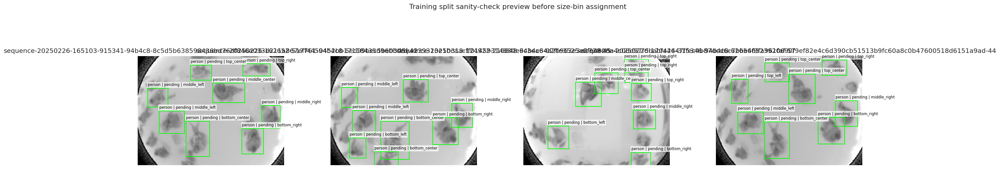

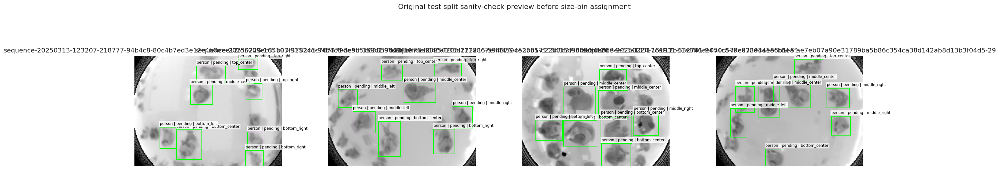

In [4]:
train_instance_df = enrich_instance_table(train_instance_df)
test_instance_df = enrich_instance_table(test_instance_df)

display(Markdown('### Training instance-level table preview'))
display(train_instance_df.head(10))

display(Markdown('### Original test instance-level table preview'))
display(test_instance_df.head(10))

preview_image_ids = train_image_df.sort_values('n_annotations', ascending=False)['image_id'].head(4).tolist()
test_preview_image_ids = test_image_df.sort_values('n_annotations', ascending=False)['image_id'].head(4).tolist()

preview_images_with_boxes(
    train_image_df,
    train_instance_df.assign(size_bin_preview='pending'),
    preview_image_ids,
    size_col='size_bin_preview',
    title='Training split sanity-check preview before size-bin assignment',
)
preview_images_with_boxes(
    test_image_df,
    test_instance_df.assign(size_bin_preview='pending'),
    test_preview_image_ids,
    size_col='size_bin_preview',
    title='Original test split sanity-check preview before size-bin assignment',
)


## 4. Slice definition: global vs class-conditioned size bins

Both strategies use `bbox_area_ratio = bbox_area / image_area`.

- `global`: the `small / medium / large` thresholds are computed once over all training instances.
- `class_conditioned`: the thresholds are computed separately inside each class unless the class is too rare or too degenerate, in which case the notebook falls back to the global thresholds and records that decision.


### Global size-bin thresholds

,scope,n_instances,q33_threshold,q67_threshold,min_ratio,median_ratio,max_ratio
0,global,16822,0.02271,0.039161,0.000013,0.030978,0.191241


### Global size-bin occupancy summary on the training split

,size_bin,bin_min,bin_max,n_instances,q33_threshold,q67_threshold
0,small,0.000013,0.022710,5608,0.02271,0.039161
1,medium,0.022710,0.039158,5606,0.02271,0.039161
2,large,0.039161,0.191241,5608,0.02271,0.039161


### Per-class thresholds for class-conditioned size bins (fit on training split)

,class_label,n_instances,n_unique_ratios,q33_threshold,q67_threshold,threshold_source,fallback_reason,class_min_ratio,class_median_ratio,class_max_ratio
0,person,16822,16797,0.02271,0.039161,class_quantile,None,0.000013,0.030978,0.191241


### Applied class-conditioned thresholds on the original test split

,class_label,n_instances,q33_threshold,q67_threshold,threshold_source
0,person,2026,0.02271,0.039161,train_class_threshold


No training classes needed a global-threshold fallback.
All test classes matched class-conditioned thresholds learned from training.


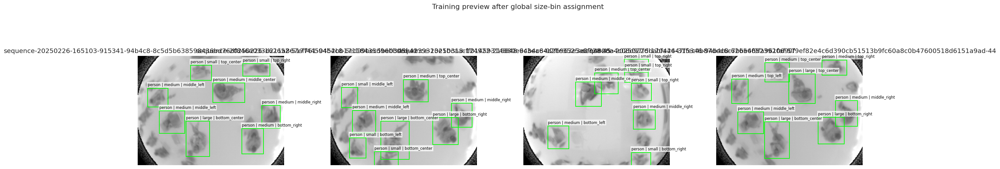

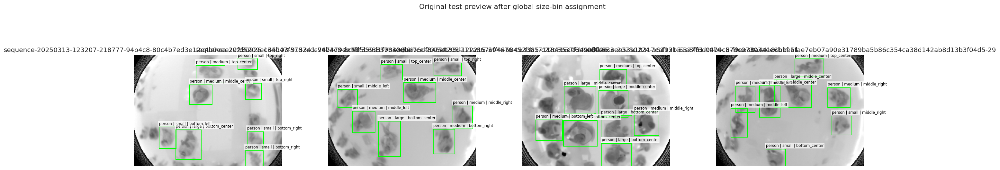

In [5]:
size_thresholds_global_df, global_size_bin_summary_df, global_q33, global_q67 = compute_global_thresholds(train_instance_df)
size_thresholds_class_df, train_instance_df = compute_class_conditioned_thresholds(
    train_instance_df,
    global_q33=global_q33,
    global_q67=global_q67,
    min_instances=MIN_CLASS_INSTANCES_FOR_LOCAL_QUANTILES,
)
test_applied_class_thresholds_df, test_instance_df = apply_class_conditioned_thresholds(
    test_instance_df,
    size_thresholds_class_df,
    global_q33=global_q33,
    global_q67=global_q67,
)

train_instance_df['size_bin_global'] = assign_bins_from_thresholds(train_instance_df['bbox_area_ratio'], global_q33, global_q67)
train_instance_df['slice_global'] = list(zip(
    train_instance_df['class_label'].astype(str),
    train_instance_df['size_bin_global'].astype(str),
    train_instance_df['position_bin'].astype(str),
))
train_instance_df['slice_class_conditioned'] = list(zip(
    train_instance_df['class_label'].astype(str),
    train_instance_df['size_bin_class_conditioned'].astype(str),
    train_instance_df['position_bin'].astype(str),
))

test_instance_df['size_bin_global'] = assign_bins_from_thresholds(test_instance_df['bbox_area_ratio'], global_q33, global_q67)
test_instance_df['slice_global'] = list(zip(
    test_instance_df['class_label'].astype(str),
    test_instance_df['size_bin_global'].astype(str),
    test_instance_df['position_bin'].astype(str),
))
test_instance_df['slice_class_conditioned'] = list(zip(
    test_instance_df['class_label'].astype(str),
    test_instance_df['size_bin_class_conditioned'].astype(str),
    test_instance_df['position_bin'].astype(str),
))

fallback_classes_df = size_thresholds_class_df.loc[
    size_thresholds_class_df['threshold_source'] == 'global_fallback'
].reset_index(drop=True)

test_missing_threshold_classes_df = test_applied_class_thresholds_df.loc[
    test_applied_class_thresholds_df['threshold_source'] == 'train_global_fallback_missing_class'
].reset_index(drop=True)

display(Markdown('### Global size-bin thresholds'))
display(size_thresholds_global_df)

display(Markdown('### Global size-bin occupancy summary on the training split'))
display(global_size_bin_summary_df)

display(Markdown('### Per-class thresholds for class-conditioned size bins (fit on training split)'))
display(size_thresholds_class_df)

display(Markdown('### Applied class-conditioned thresholds on the original test split'))
display(test_applied_class_thresholds_df)

if not fallback_classes_df.empty:
    display(Markdown('### Fallback classes for class-conditioned thresholds on training'))
    display(fallback_classes_df[['class_label', 'n_instances', 'n_unique_ratios', 'fallback_reason']])
else:
    print('No training classes needed a global-threshold fallback.')

if not test_missing_threshold_classes_df.empty:
    display(Markdown('### Test classes missing training class-conditioned thresholds'))
    display(test_missing_threshold_classes_df)
else:
    print('All test classes matched class-conditioned thresholds learned from training.')

preview_images_with_boxes(
    train_image_df,
    train_instance_df,
    preview_image_ids,
    size_col='size_bin_global',
    title='Training preview after global size-bin assignment',
)
preview_images_with_boxes(
    test_image_df,
    test_instance_df,
    test_preview_image_ids,
    size_col='size_bin_global',
    title='Original test preview after global size-bin assignment',
)


## 5. Full training-set distribution analysis

This section computes the slice structure for the full training split under both strategies.
The goal is to make the marginals, the joint structure, and the coverage/skew metrics easy to inspect before any subset selection happens.


In [6]:
full_train_global_bundle = build_analysis_bundle(
    train_instance_df,
    train_image_df,
    size_col='size_bin_global',
    slice_col='slice_global',
    label='Full train | global size bins',
    class_labels=class_order,
)
full_train_class_conditioned_bundle = build_analysis_bundle(
    train_instance_df,
    train_image_df,
    size_col='size_bin_class_conditioned',
    slice_col='slice_class_conditioned',
    label='Full train | class-conditioned size bins',
    class_labels=class_order,
)

strategy_summary_df = pd.DataFrame(
    [
        {'size_bin_strategy': 'global', **full_train_global_bundle['summary']},
        {'size_bin_strategy': 'class_conditioned', **full_train_class_conditioned_bundle['summary']},
    ]
)

display(Markdown('### Strategy comparison summary table'))
display(strategy_summary_df)


### Strategy comparison summary table

,size_bin_strategy,dataset_view,n_images,n_instances,avg_instances_per_image,active_slices,coverage_fraction,normalized_entropy,gini,top_10_mass_share,rare_slices_lt_2,rare_slices_lt_5,rare_slices_lt_10
0,global,Full train | global size bins,6725,16822,2.501413,27,1.0,0.965967,0.240624,0.530317,0,1,1
1,class_conditioned,Full train | class-conditioned size bins,6725,16822,2.501413,27,1.0,0.965967,0.240624,0.530317,0,1,1


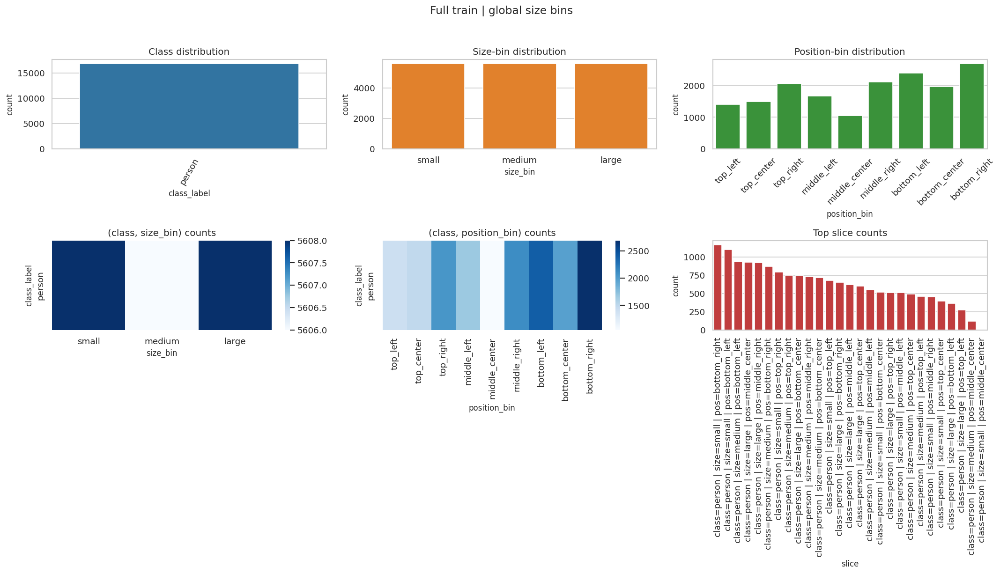

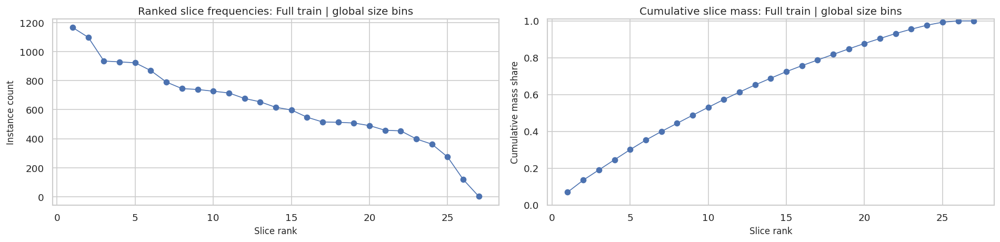

In [7]:
plot_strategy_overview(full_train_global_bundle)


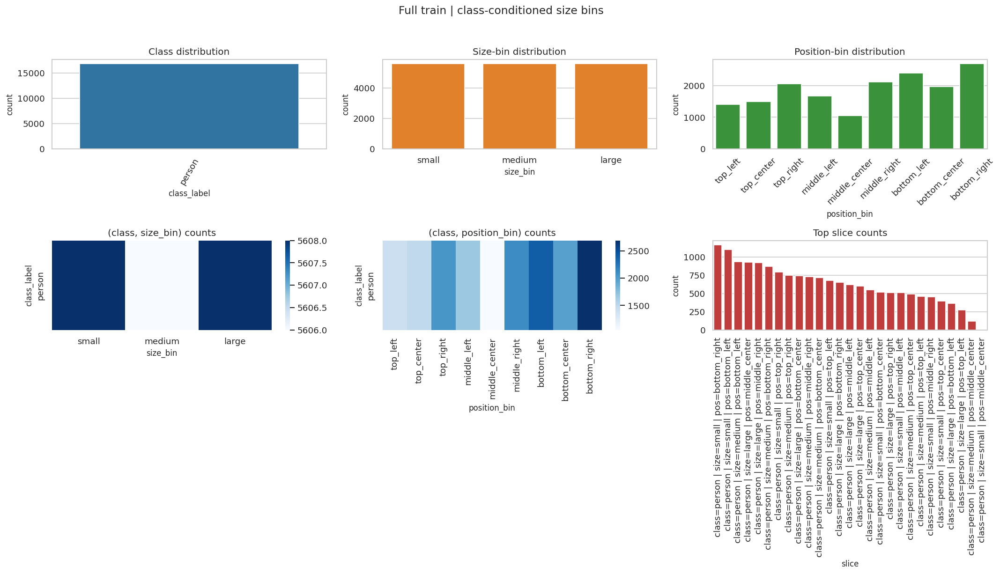

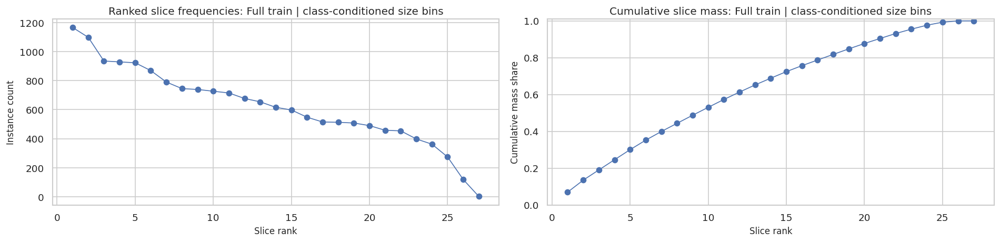

In [8]:
plot_strategy_overview(full_train_class_conditioned_bundle)


## 6. Compare both size-binning strategies on the full train split

The next table is meant to answer a practical question:
which classes become more differentiated when size is defined relative to the class instead of globally?


### Per-class size-bin counts under both strategies

,class_label,global_small,global_medium,global_large,cc_small,cc_medium,cc_large,global_max_share,cc_max_share,spread_gain
0,person,5608,5606,5608,5608,5606,5608,0.333373,0.333373,0.0


### Classes highlighted for global collapse or clear spread gain

,note
0,No class met the collapse/spread-gain highligh...


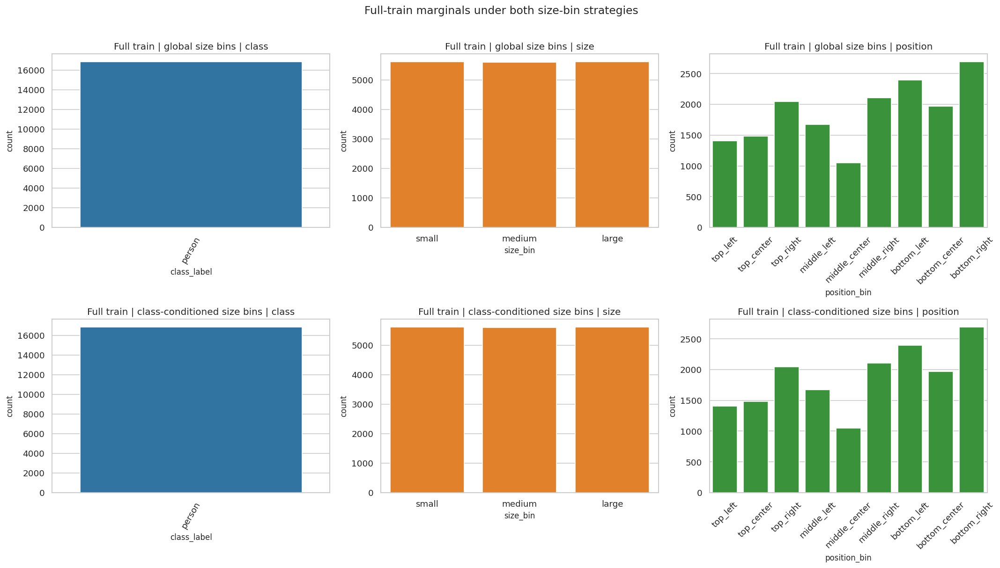

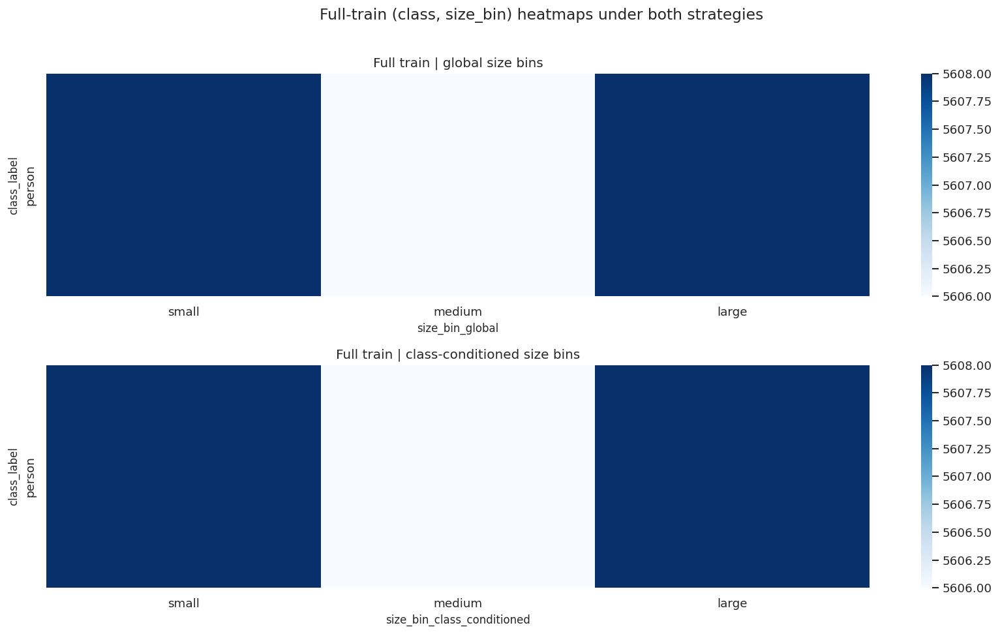

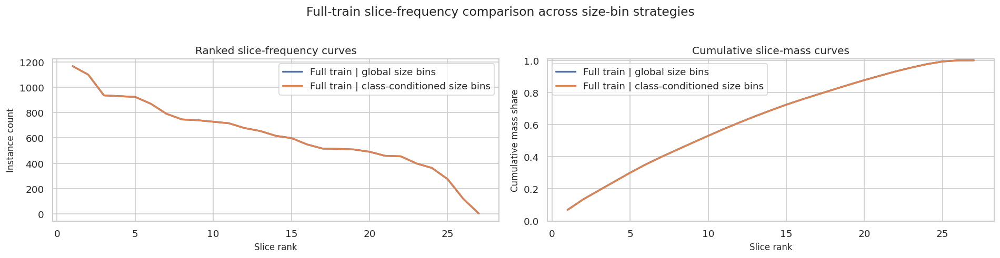

In [9]:
global_class_size_df = pd.crosstab(train_instance_df['class_label'], train_instance_df['size_bin_global']).reindex(
    index=class_order,
    columns=SIZE_BIN_ORDER,
    fill_value=0,
)
cc_class_size_df = pd.crosstab(train_instance_df['class_label'], train_instance_df['size_bin_class_conditioned']).reindex(
    index=class_order,
    columns=SIZE_BIN_ORDER,
    fill_value=0,
)

per_class_strategy_counts_df = pd.concat(
    [
        global_class_size_df.add_prefix('global_'),
        cc_class_size_df.add_prefix('cc_'),
    ],
    axis=1,
).reset_index().rename(columns={'index': 'class_label'})

global_totals = global_class_size_df.sum(axis=1).replace(0, np.nan)
cc_totals = cc_class_size_df.sum(axis=1).replace(0, np.nan)
per_class_strategy_counts_df['global_max_share'] = (global_class_size_df.max(axis=1) / global_totals).to_numpy()
per_class_strategy_counts_df['cc_max_share'] = (cc_class_size_df.max(axis=1) / cc_totals).to_numpy()
per_class_strategy_counts_df['spread_gain'] = per_class_strategy_counts_df['global_max_share'] - per_class_strategy_counts_df['cc_max_share']
per_class_strategy_counts_df = per_class_strategy_counts_df.sort_values(['spread_gain', 'global_max_share'], ascending=False).reset_index(drop=True)

highlighted_class_diagnostics_df = per_class_strategy_counts_df.loc[
    (per_class_strategy_counts_df['global_max_share'] >= 0.8) |
    (per_class_strategy_counts_df['spread_gain'] >= 0.25)
].reset_index(drop=True)

display(Markdown('### Per-class size-bin counts under both strategies'))
display(per_class_strategy_counts_df)

display(Markdown('### Classes highlighted for global collapse or clear spread gain'))
display(highlighted_class_diagnostics_df if not highlighted_class_diagnostics_df.empty else pd.DataFrame({'note': ['No class met the collapse/spread-gain highlighting rule.']}))

plot_comparison_marginals(
    [full_train_global_bundle, full_train_class_conditioned_bundle],
    title_prefix='Full-train marginals under both size-bin strategies',
)
plot_comparison_heatmaps(
    [full_train_global_bundle, full_train_class_conditioned_bundle],
    attr='class_size_counts',
    title_prefix='Full-train (class, size_bin) heatmaps under both strategies',
)
plot_ranked_slice_comparison(
    [full_train_global_bundle, full_train_class_conditioned_bundle],
    title_prefix='Full-train slice-frequency comparison across size-bin strategies',
)


## 6b. Original test-set distribution analysis

This section applies the same slice-analysis pipeline to the original on-disk test split.
The global and class-conditioned size-bin assignments remain anchored to thresholds learned from the training split so the comparison stays directly interpretable.


### Original test-set strategy comparison summary table

,size_bin_strategy,dataset_view,n_images,n_instances,avg_instances_per_image,active_slices,coverage_fraction,normalized_entropy,gini,top_10_mass_share,rare_slices_lt_2,rare_slices_lt_5,rare_slices_lt_10
0,global,Original test set | global size bins,799,2026,2.53567,26,0.962963,0.962452,0.252568,0.537019,0,0,0
1,class_conditioned,Original test set | class-conditioned size bins,799,2026,2.53567,26,0.962963,0.962452,0.252568,0.537019,0,0,0


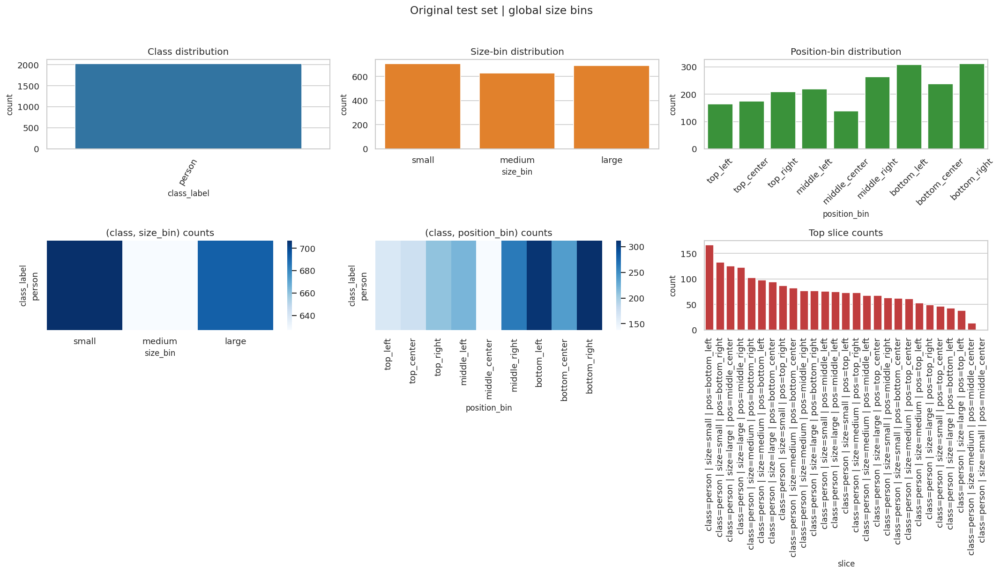

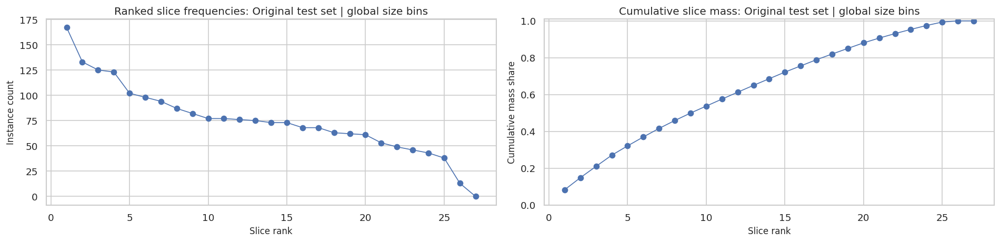

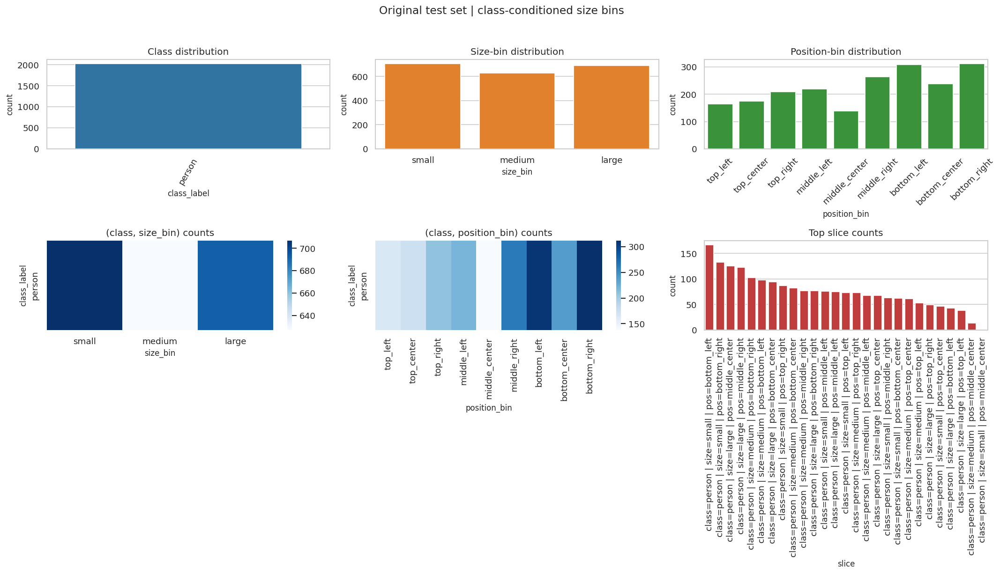

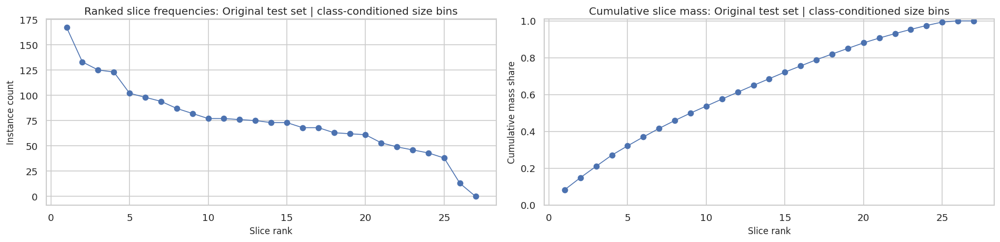

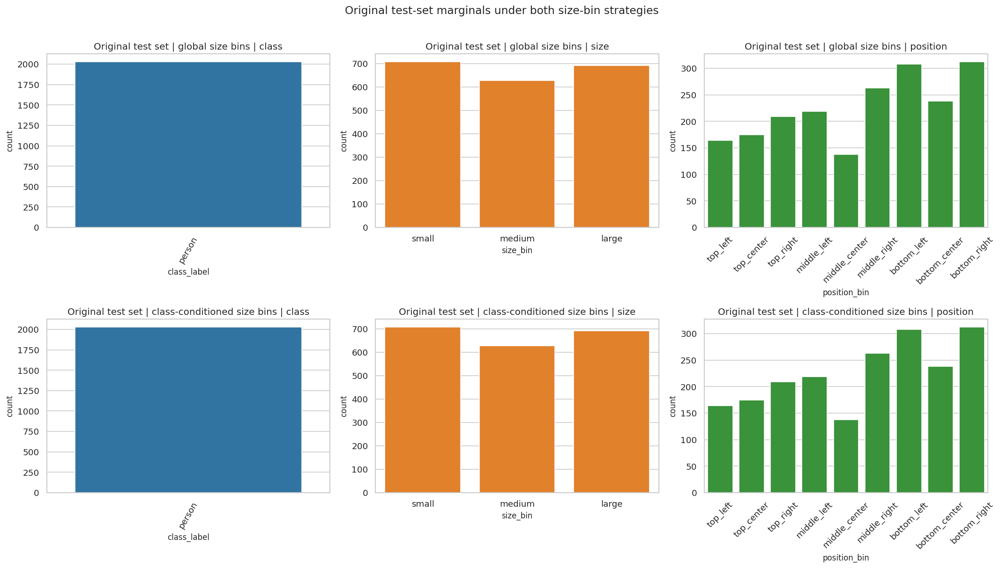

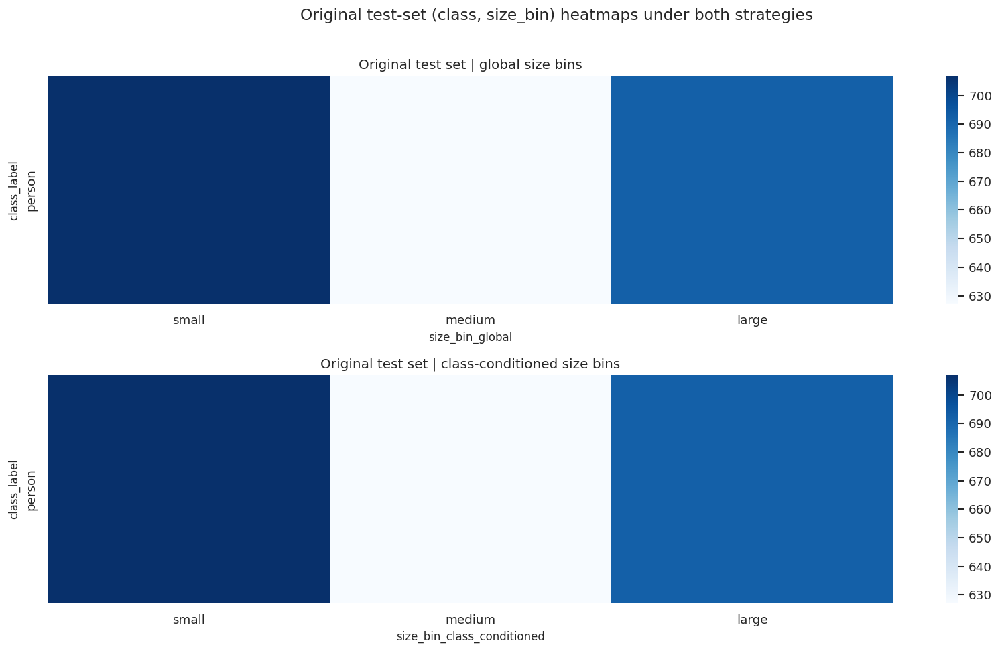

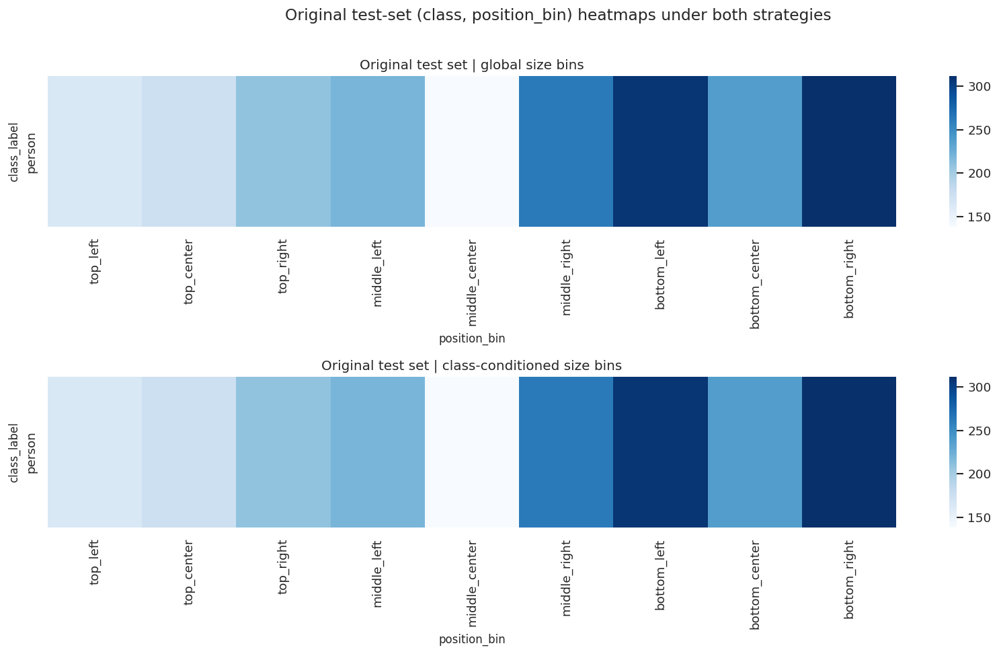

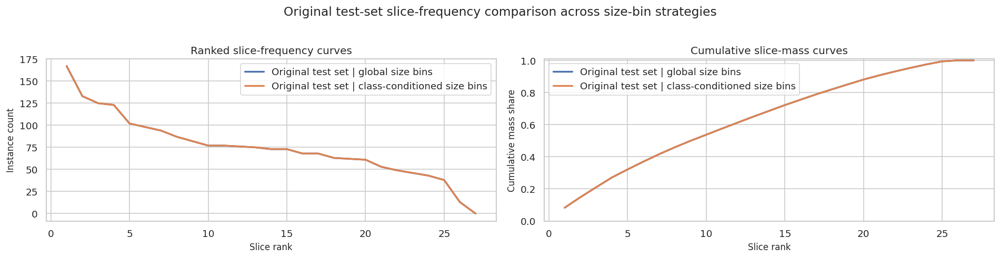

/tmp/ipykernel_2948107/545768699.py:445: UserWarning: Tight layout not applied. tight_layout cannot make Axes height small enough to accommodate all Axes decorations.
  plt.tight_layout()


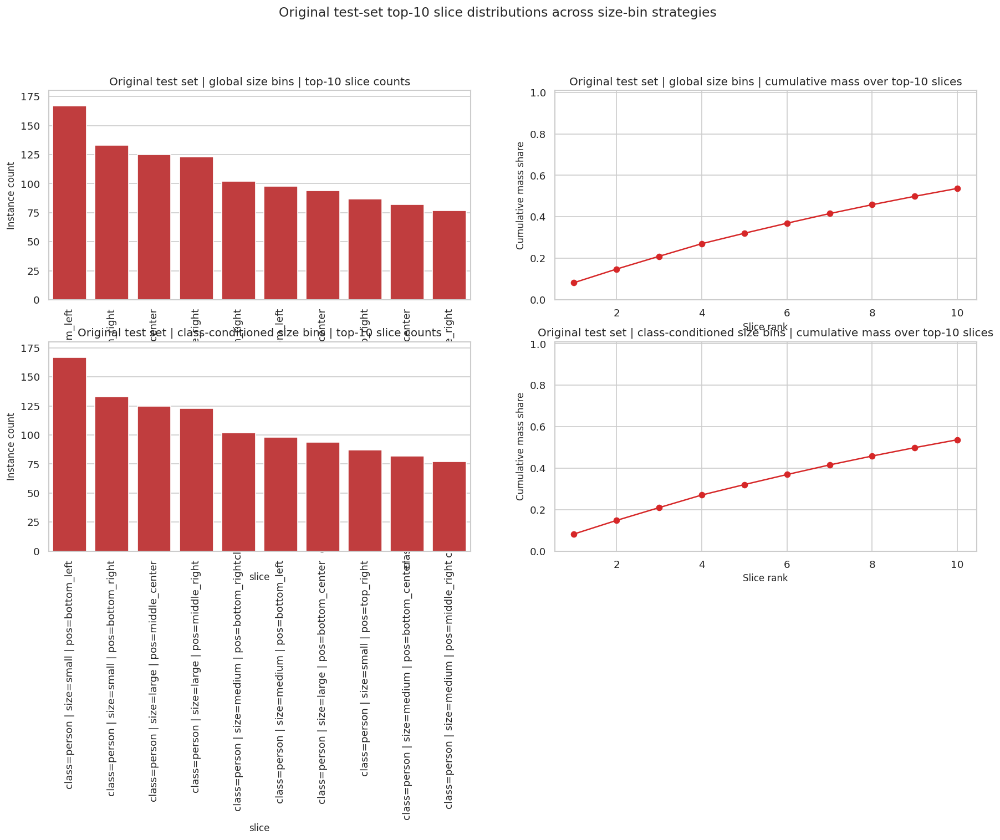

In [10]:
original_test_global_bundle = build_analysis_bundle(
    test_instance_df,
    test_image_df,
    size_col='size_bin_global',
    slice_col='slice_global',
    label='Original test set | global size bins',
    class_labels=class_order,
)
original_test_class_conditioned_bundle = build_analysis_bundle(
    test_instance_df,
    test_image_df,
    size_col='size_bin_class_conditioned',
    slice_col='slice_class_conditioned',
    label='Original test set | class-conditioned size bins',
    class_labels=class_order,
)

test_strategy_summary_df = pd.DataFrame(
    [
        {'size_bin_strategy': 'global', **original_test_global_bundle['summary']},
        {'size_bin_strategy': 'class_conditioned', **original_test_class_conditioned_bundle['summary']},
    ]
)

display(Markdown('### Original test-set strategy comparison summary table'))
display(test_strategy_summary_df)

plot_strategy_overview(original_test_global_bundle)
plot_strategy_overview(original_test_class_conditioned_bundle)
plot_comparison_marginals(
    [original_test_global_bundle, original_test_class_conditioned_bundle],
    title_prefix='Original test-set marginals under both size-bin strategies',
)
plot_comparison_heatmaps(
    [original_test_global_bundle, original_test_class_conditioned_bundle],
    attr='class_size_counts',
    title_prefix='Original test-set (class, size_bin) heatmaps under both strategies',
)
plot_comparison_heatmaps(
    [original_test_global_bundle, original_test_class_conditioned_bundle],
    attr='class_position_counts',
    title_prefix='Original test-set (class, position_bin) heatmaps under both strategies',
)
plot_ranked_slice_comparison(
    [original_test_global_bundle, original_test_class_conditioned_bundle],
    title_prefix='Original test-set slice-frequency comparison across size-bin strategies',
)
plot_top_k_slice_panels(
    [original_test_global_bundle, original_test_class_conditioned_bundle],
    title_prefix=f'Original test-set top-{TOP_K_SLICES} slice distributions across size-bin strategies',
    top_k=TOP_K_SLICES,
)


## 7. Subset construction

Subset selection is done for **one** strategy at a time, controlled by `SIZE_BIN_STRATEGY` at the top of the notebook.
Both subsets use the same image budget and only differ in how the greedy score rewards rare versus already-common slices.


In [11]:
if SIZE_BIN_STRATEGY == 'global':
    selected_size_col = 'size_bin_global'
    selected_slice_col = 'slice_global'
    selected_strategy_title = 'global'
    selected_full_bundle = full_train_global_bundle
else:
    selected_size_col = 'size_bin_class_conditioned'
    selected_slice_col = 'slice_class_conditioned'
    selected_strategy_title = 'class_conditioned'
    selected_full_bundle = full_train_class_conditioned_bundle

possible_slices = build_possible_slices(class_order)
image_slice_counts, image_instance_count, full_slice_count, train_avg_instances_per_image = prepare_image_slice_data(
    train_instance_df,
    selected_slice_col,
)

balanced_subset_image_ids = select_subset_greedy(
    image_slice_counts,
    image_instance_count,
    full_slice_count,
    train_avg_instances_per_image,
    subset_num_images=SUBSET_NUM_IMAGES,
    mode='balanced',
    possible_slices=possible_slices,
    progress_every=50,
)
unbalanced_subset_image_ids = select_subset_greedy(
    image_slice_counts,
    image_instance_count,
    full_slice_count,
    train_avg_instances_per_image,
    subset_num_images=SUBSET_NUM_IMAGES,
    mode='unbalanced',
    possible_slices=possible_slices,
    progress_every=50,
)

print(f'Balanced subset image count: {len(balanced_subset_image_ids):,}')
print(f'Unbalanced subset image count: {len(unbalanced_subset_image_ids):,}')


[balanced] step=   1 | images=   1 | instances=     3 | active_slices=  3 | coverage=0.111 | top_10_mass=1.000
[balanced] step=  50 | images=  50 | instances=   442 | active_slices= 27 | coverage=1.000 | top_10_mass=0.511
[balanced] step= 100 | images= 100 | instances=   845 | active_slices= 27 | coverage=1.000 | top_10_mass=0.518
[balanced] step= 150 | images= 150 | instances=  1202 | active_slices= 27 | coverage=1.000 | top_10_mass=0.511
[balanced] step= 200 | images= 200 | instances=  1535 | active_slices= 27 | coverage=1.000 | top_10_mass=0.505
[balanced] step= 250 | images= 250 | instances=  1835 | active_slices= 27 | coverage=1.000 | top_10_mass=0.490
[balanced] step= 300 | images= 300 | instances=  2139 | active_slices= 27 | coverage=1.000 | top_10_mass=0.486
[balanced] step= 350 | images= 350 | instances=  2425 | active_slices= 27 | coverage=1.000 | top_10_mass=0.479
[balanced] step= 400 | images= 400 | instances=  2675 | active_slices= 27 | coverage=1.000 | top_10_mass=0.472
[

[unbalanced] step= 550 | images= 550 | instances=  2925 | active_slices= 26 | coverage=0.963 | top_10_mass=0.727
[unbalanced] step= 600 | images= 600 | instances=  3431 | active_slices= 26 | coverage=0.963 | top_10_mass=0.708
[unbalanced] step= 650 | images= 650 | instances=  3780 | active_slices= 26 | coverage=0.963 | top_10_mass=0.707
[unbalanced] step= 700 | images= 700 | instances=  4044 | active_slices= 26 | coverage=0.963 | top_10_mass=0.707
[unbalanced] step= 750 | images= 750 | instances=  4310 | active_slices= 26 | coverage=0.963 | top_10_mass=0.704
[unbalanced] step= 800 | images= 800 | instances=  4538 | active_slices= 26 | coverage=0.963 | top_10_mass=0.701
[unbalanced] step= 850 | images= 850 | instances=  4776 | active_slices= 26 | coverage=0.963 | top_10_mass=0.698
[unbalanced] step= 900 | images= 900 | instances=  5016 | active_slices= 26 | coverage=0.963 | top_10_mass=0.691
[unbalanced] step= 950 | images= 950 | instances=  5190 | active_slices= 26 | coverage=0.963 | t

## 8. Partition comparison and sanity checks

We now rebuild the same slice analysis for:

- the full training split,
- the balanced subset,
- the unbalanced subset,
- the original test split,

all under the currently selected size-binning strategy.


In [12]:
balanced_image_set = set(balanced_subset_image_ids)
unbalanced_image_set = set(unbalanced_subset_image_ids)

balanced_subset_image_df = train_image_df.loc[train_image_df['image_id'].isin(balanced_image_set)].copy().sort_values('image_id').reset_index(drop=True)
unbalanced_subset_image_df = train_image_df.loc[train_image_df['image_id'].isin(unbalanced_image_set)].copy().sort_values('image_id').reset_index(drop=True)

balanced_subset_instance_df = train_instance_df.loc[train_instance_df['image_id'].isin(balanced_image_set)].copy().sort_values(['image_id', 'ann_id']).reset_index(drop=True)
unbalanced_subset_instance_df = train_instance_df.loc[train_instance_df['image_id'].isin(unbalanced_image_set)].copy().sort_values(['image_id', 'ann_id']).reset_index(drop=True)

balanced_bundle = build_analysis_bundle(
    balanced_subset_instance_df,
    balanced_subset_image_df,
    size_col=selected_size_col,
    slice_col=selected_slice_col,
    label=f'Balanced subset | {selected_strategy_title}',
    class_labels=class_order,
)
unbalanced_bundle = build_analysis_bundle(
    unbalanced_subset_instance_df,
    unbalanced_subset_image_df,
    size_col=selected_size_col,
    slice_col=selected_slice_col,
    label=f'Unbalanced subset | {selected_strategy_title}',
    class_labels=class_order,
)
selected_test_bundle = build_analysis_bundle(
    test_instance_df,
    test_image_df,
    size_col='size_bin_global' if SIZE_BIN_STRATEGY == 'global' else 'size_bin_class_conditioned',
    slice_col='slice_global' if SIZE_BIN_STRATEGY == 'global' else 'slice_class_conditioned',
    label=f'Original test set | {selected_strategy_title}',
    class_labels=class_order,
)

subset_comparison_df = pd.DataFrame(
    [
        {'dataset_view': f'full_train | {selected_strategy_title}', **selected_full_bundle['summary']},
        {'dataset_view': f'balanced_subset | {selected_strategy_title}', **balanced_bundle['summary']},
        {'dataset_view': f'unbalanced_subset | {selected_strategy_title}', **unbalanced_bundle['summary']},
        {'dataset_view': f'original_test | {selected_strategy_title}', **selected_test_bundle['summary']},
    ]
)

display(Markdown('### Summary table: full train vs balanced subset vs unbalanced subset vs original test set'))
display(subset_comparison_df)

balanced_instances = len(balanced_subset_instance_df)
unbalanced_instances = len(unbalanced_subset_instance_df)
instance_count_ratio = max(balanced_instances, unbalanced_instances) / max(min(balanced_instances, unbalanced_instances), 1)
print(f'Instance count ratio between the two subsets: {instance_count_ratio:.3f}')
if instance_count_ratio > 1.25:
    print('WARNING: the larger subset has more than 25% more instances than the smaller subset.')


### Summary table: full train vs balanced subset vs unbalanced subset vs original test set

,dataset_view,n_images,n_instances,avg_instances_per_image,active_slices,coverage_fraction,normalized_entropy,gini,top_10_mass_share,rare_slices_lt_2,rare_slices_lt_5,rare_slices_lt_10
0,Full train | global size bins,6725,16822,2.501413,27,1.000000,0.965967,0.240624,0.530317,0,1,1
1,Balanced subset | global,2000,9081,4.540500,27,1.000000,0.978982,0.164030,0.468781,0,1,1
2,Unbalanced subset | global,2000,8981,4.490500,26,0.962963,0.924986,0.380985,0.636789,0,0,0
3,Original test set | global,799,2026,2.535670,26,0.962963,0.962452,0.252568,0.537019,0,0,0


Instance count ratio between the two subsets: 1.011


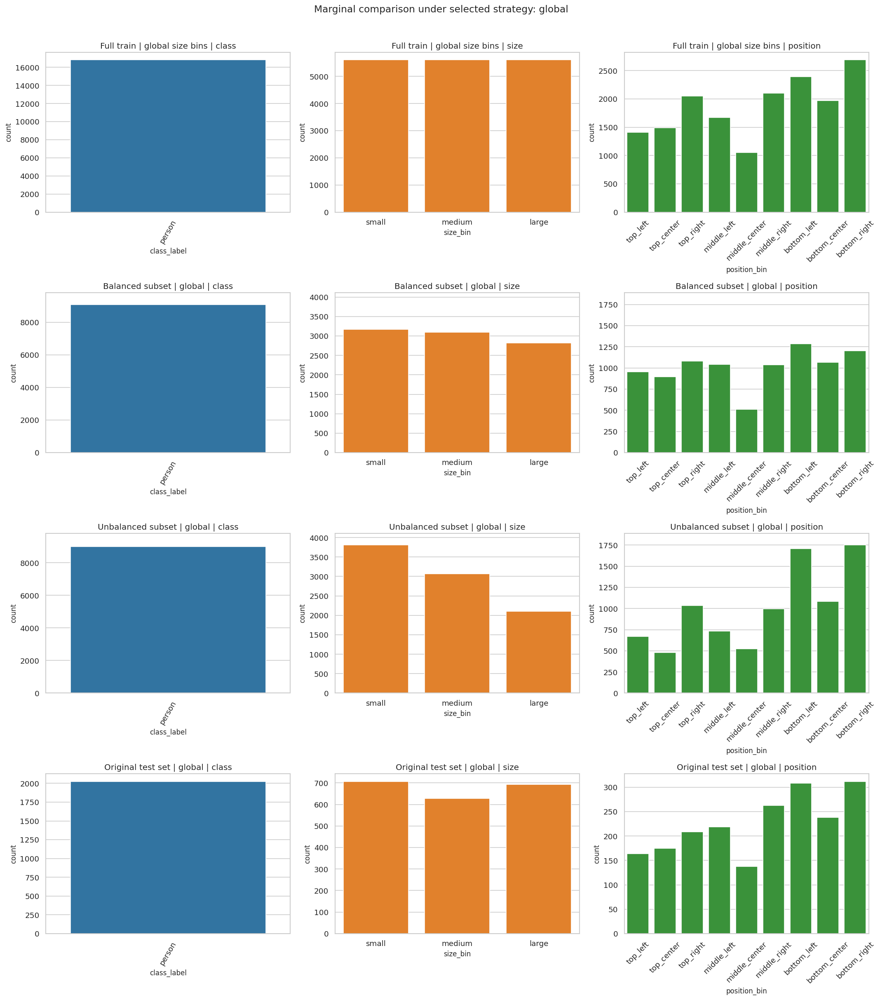

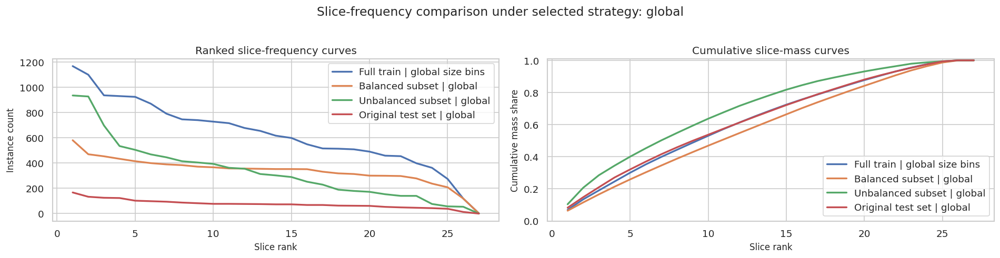

/tmp/ipykernel_2948107/545768699.py:445: UserWarning: Tight layout not applied. tight_layout cannot make Axes height small enough to accommodate all Axes decorations.
  plt.tight_layout()


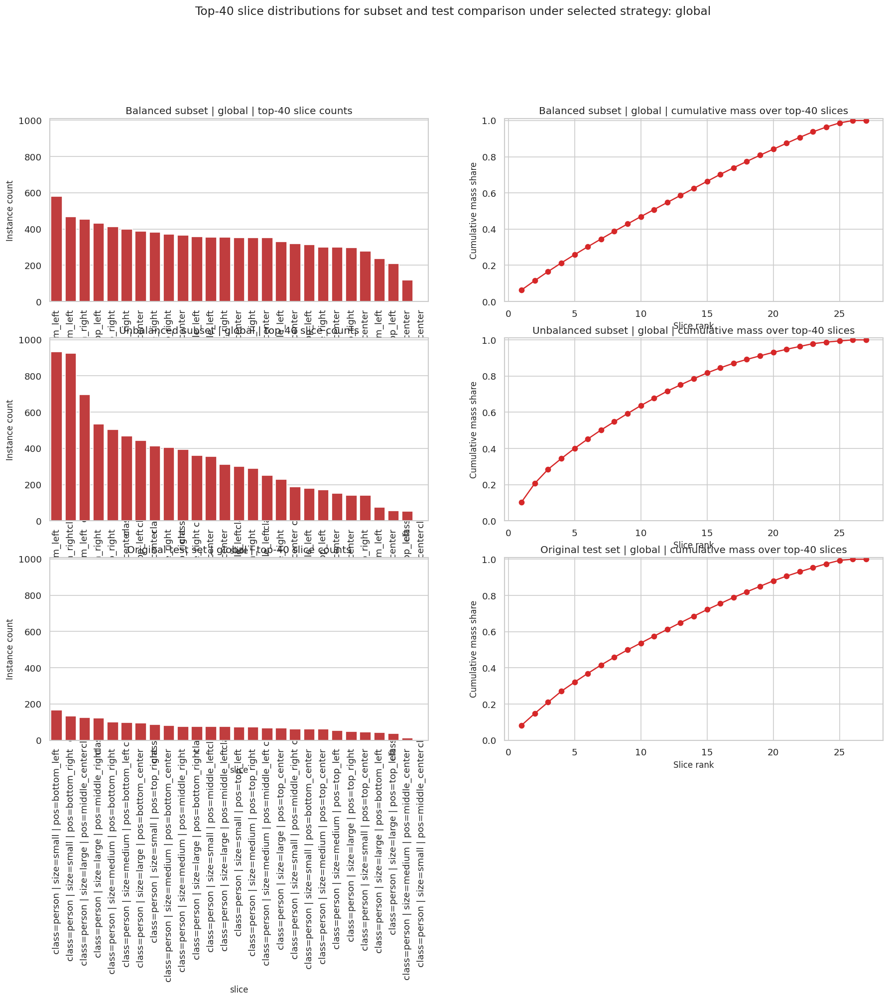

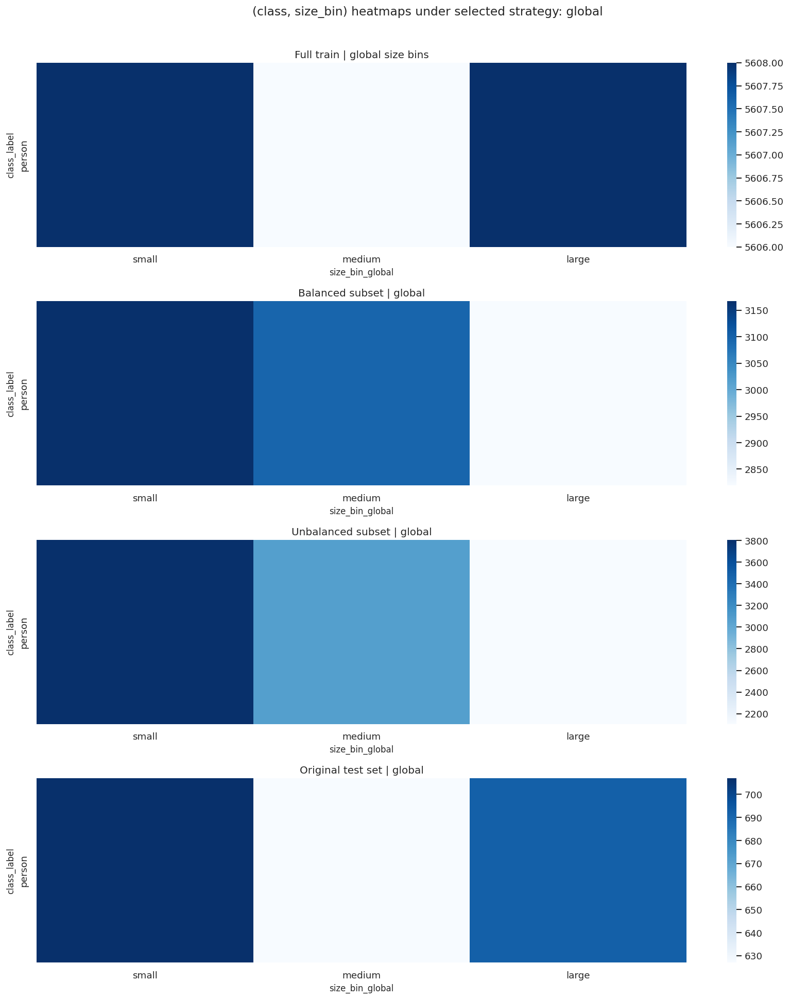

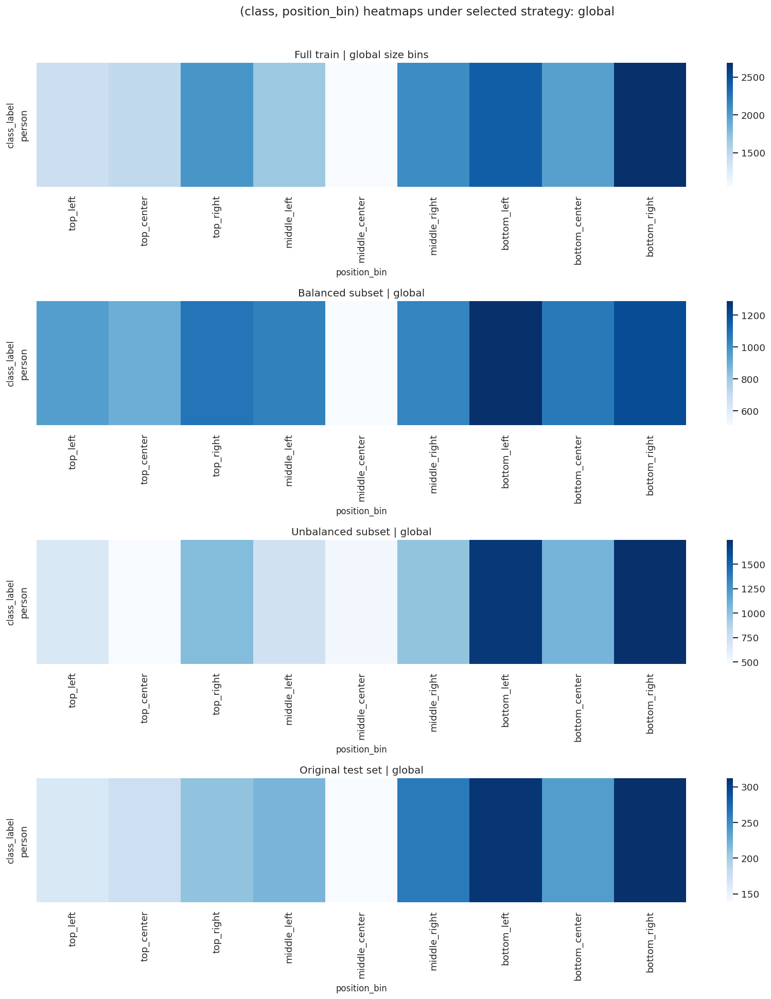

In [13]:
comparison_bundles = [selected_full_bundle, balanced_bundle, unbalanced_bundle, selected_test_bundle]
subset_only_bundles = [balanced_bundle, unbalanced_bundle]
comparison_top_k_bundles = [balanced_bundle, unbalanced_bundle, selected_test_bundle]

plot_comparison_marginals(
    comparison_bundles,
    title_prefix=f'Marginal comparison under selected strategy: {selected_strategy_title}',
    shared_y_bundles=subset_only_bundles,
)
plot_ranked_slice_comparison(
    comparison_bundles,
    title_prefix=f'Slice-frequency comparison under selected strategy: {selected_strategy_title}',
)
plot_top_k_slice_panels(
    comparison_top_k_bundles,
    title_prefix=f'Top-{40} slice distributions for subset and test comparison under selected strategy: {selected_strategy_title}',
    top_k=40,
)
plot_comparison_heatmaps(
    comparison_bundles,
    attr='class_size_counts',
    title_prefix=f'(class, size_bin) heatmaps under selected strategy: {selected_strategy_title}',
)
plot_comparison_heatmaps(
    comparison_bundles,
    attr='class_position_counts',
    title_prefix=f'(class, position_bin) heatmaps under selected strategy: {selected_strategy_title}',
)


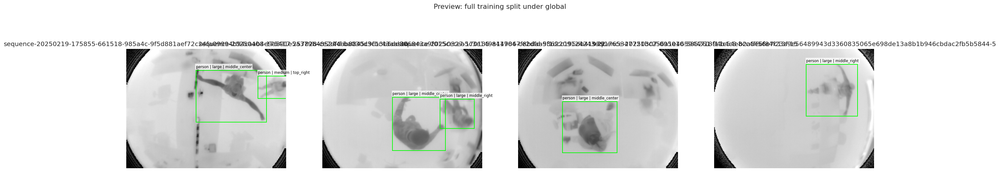

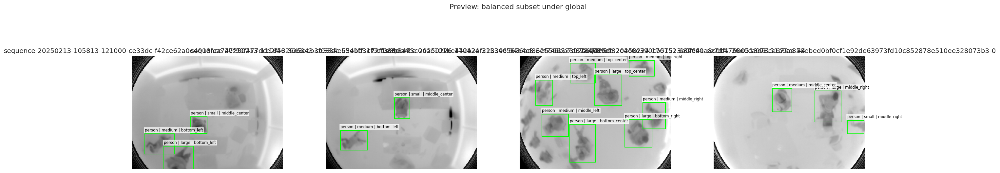

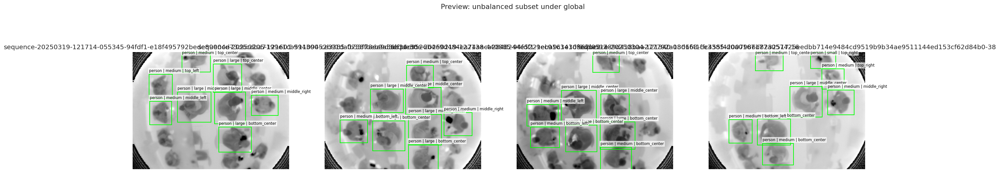

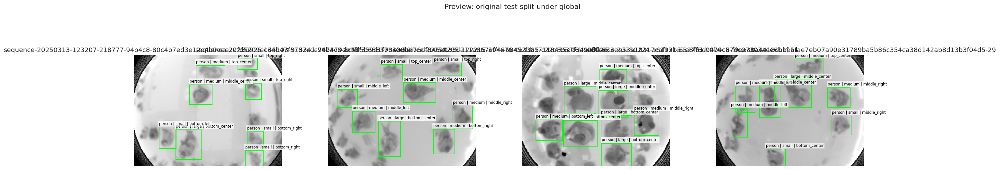

In [14]:
preview_images_with_boxes(
    train_image_df,
    train_instance_df,
    selected_full_bundle['working_df'].sort_values('bbox_area', ascending=False)['image_id'].drop_duplicates().head(4).tolist(),
    size_col=selected_size_col,
    title=f'Preview: full training split under {selected_strategy_title}',
)
preview_images_with_boxes(
    balanced_subset_image_df,
    balanced_subset_instance_df,
    balanced_subset_image_ids[:4],
    size_col=selected_size_col,
    title=f'Preview: balanced subset under {selected_strategy_title}',
)
preview_images_with_boxes(
    unbalanced_subset_image_df,
    unbalanced_subset_instance_df,
    unbalanced_subset_image_ids[:4],
    size_col=selected_size_col,
    title=f'Preview: unbalanced subset under {selected_strategy_title}',
)
preview_images_with_boxes(
    test_image_df,
    test_instance_df,
    test_preview_image_ids,
    size_col='size_bin_global' if SIZE_BIN_STRATEGY == 'global' else 'size_bin_class_conditioned',
    title=f'Preview: original test split under {selected_strategy_title}',
)


## 9. YOLO dataset export only

This section only exports the balanced subset, unbalanced subset, shared validation split, and original test split to YOLO format under the derived-data tree.
It does not launch training or evaluation jobs.

The generated YAML files are dataset-definition files for Ultralytics YOLO:
- `balanced.yaml`: train on the balanced subset, validate on the shared original validation split, test on the shared original test split
- `unbalanced.yaml`: train on the unbalanced subset, validate on the shared original validation split, test on the shared original test split
- `test.yaml`: points at the shared original test export and can be used for explicit test-set evaluation


In [15]:
from src.analysis.flir_subgroup.yolo_export import export_experiment_a_yolo_datasets
from src.core.paths import yolo_test_ds_root

VAL_SPLIT = "val"
if VAL_SPLIT not in set(dataset_layout_df["split"]):
    raise ValueError(f"Required validation split {VAL_SPLIT!r} was not discovered under {DATASET_ROOT}.")

val_image_df, val_instance_df, _ = load_dataset_tables(dataset_layout_df, selected_splits=[VAL_SPLIT])
val_image_df = val_image_df.copy().sort_values('image_id').reset_index(drop=True)
val_instance_df = val_instance_df.copy().sort_values(['image_id', 'ann_id']).reset_index(drop=True)

yolo_export_result = export_experiment_a_yolo_datasets(
    output_root=f"{yolo_test_ds_root()}_v18",
    category_table=category_table,
    balanced_image_df=balanced_subset_image_df,
    balanced_instance_df=balanced_subset_instance_df,
    unbalanced_image_df=unbalanced_subset_image_df,
    unbalanced_instance_df=unbalanced_subset_instance_df,
    val_image_df=val_image_df,
    val_instance_df=val_instance_df,
    test_image_df=test_image_df,
    test_instance_df=test_instance_df,
    overwrite=True,
)

display(Markdown('### YOLO export summary'))
display(yolo_export_result['summary_df'])

display(Markdown('### YOLO dataset files created by this cell'))
print(f"Balanced dataset YAML:   {yolo_export_result['balanced_yaml']}")
print('  Use this when you want YOLO to train on the balanced subset.')
print(f"Unbalanced dataset YAML: {yolo_export_result['unbalanced_yaml']}")
print('  Use this when you want YOLO to train on the unbalanced subset.')
print(f"Shared test-set YAML:    {yolo_export_result['test_yaml']}")
print('  Use this when you want an explicit dataset definition for the exported test split.')
print(f"Export manifest:         {yolo_export_result['manifest_path']}")

print('\nThis notebook section stops after dataset export. It does not start any training or evaluation job.')


/projets/Fbassignana/diffusers_try/flow_matching_trial/src/analysis/flir_subgroup/yolo_export.py:298: UserWarning: Skipping 2101 images with missing source files for val/val: sequence-20250212-163342-356591-ce33dc-c12c078fcb7b249e9c0f8dd1e23890f345ac3cf8825b7e11abd9d9546798a033-11, sequence-20250212-163421-343311-ce33dc-4b2c81de66858366b3466764b2aaa6405c4d5f1b5fd948f980c9b9a54c5bbfef-7, sequence-20250212-174434-280000-9834f0-3e87a66a6ac9e358ccc72c9010ee71fc39c8c81d44f8fc96c021ff1cc209a1c7-22, sequence-20250212-174723-689960-9852f3-d0087e42f38564ff6dbbf8857f4ae69ad680818ef176d8ae5d2f4294b65f0a2e-28, sequence-20250212-175018-302096-9852f3-b55044e5dd3e5bfb3e0d350bd52298e5c25cee951aabe760b78493f26ca3152c-34, ...
  export_partition_to_yolo(


### YOLO export summary

,dataset_name,split_name,image_dir,label_dir,n_images_requested,n_images,n_label_files,n_annotations_requested,n_annotations_source,n_annotations_exported,n_empty_images,n_missing_source_images,n_annotations_skipped_missing_source
0,balanced,train,/projets/Fbassignana/diffusers_try/flow_matchi...,/projets/Fbassignana/diffusers_try/flow_matchi...,2000,2000,2000,9081,9081,9081,0,0,0
1,unbalanced,train,/projets/Fbassignana/diffusers_try/flow_matchi...,/projets/Fbassignana/diffusers_try/flow_matchi...,2000,2000,2000,8981,8981,8981,0,0,0
2,val,val,/projets/Fbassignana/diffusers_try/flow_matchi...,/projets/Fbassignana/diffusers_try/flow_matchi...,2289,188,188,5947,437,437,0,2101,5510
3,test,test,/projets/Fbassignana/diffusers_try/flow_matchi...,/projets/Fbassignana/diffusers_try/flow_matchi...,799,799,799,2026,2026,2026,2,0,0


### YOLO dataset files created by this cell

Balanced dataset YAML:   /projets/Fbassignana/diffusers_try/flow_matching_trial/data/derived/yolo-test-ds_v18/balanced.yaml
  Use this when you want YOLO to train on the balanced subset.
Unbalanced dataset YAML: /projets/Fbassignana/diffusers_try/flow_matching_trial/data/derived/yolo-test-ds_v18/unbalanced.yaml
  Use this when you want YOLO to train on the unbalanced subset.
Shared test-set YAML:    /projets/Fbassignana/diffusers_try/flow_matching_trial/data/derived/yolo-test-ds_v18/test.yaml
  Use this when you want an explicit dataset definition for the exported test split.
Export manifest:         /projets/Fbassignana/diffusers_try/flow_matching_trial/data/derived/yolo-test-ds_v18/export_manifest.json

This notebook section stops after dataset export. It does not start any training or evaluation job.


## 10. YOLO Experiment A results

This section reads the saved YOLO artifacts under `artifacts/analysis/yolo` and summarizes the finished balanced-vs-unbalanced comparison on the shared exported test split.

The storytelling is intentionally compact:
- start with the shared-test headline metrics that matter most for detector quality
- then check whether the validation curves tell a consistent story during training
- then inspect saved PR and confusion-matrix diagnostics for qualitative error patterns


In [ ]:
import json
from pathlib import Path

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import Markdown, display

from src.core.paths import repo_root

YOLO_ANALYSIS_ROOT = repo_root() / "artifacts" / "analysis" / "yolo"
YOLO_RUNS_ROOT = repo_root() / "artifacts" / "runs" / "yolo"

RUN_SPECS = {
    "exp_balanced": {
        "label": "Balanced subset",
        "color": "#1b9e77",
        "short": "Balanced",
    },
    "exp_unbalanced": {
        "label": "Unbalanced subset",
        "color": "#d95f02",
        "short": "Unbalanced",
    },
    "exp_full_train": {
        "label": "Full train set",
        "color": "#7570b3",
        "short": "full train"
    }
}

comparison_summary_path = YOLO_ANALYSIS_ROOT / "experiment_a" / "comparison_summary.csv"
if not comparison_summary_path.exists():
    raise FileNotFoundError(
        f"Missing {comparison_summary_path}. Run the YOLO experiments before executing this section."
    )

comparison_df = pd.read_csv(comparison_summary_path)
comparison_df["partition"] = comparison_df["experiment_name"].map(lambda name: RUN_SPECS[name]["label"])
metric_columns = ["map", "map50", "map75", "precision", "recall"]
comparison_df[metric_columns] = comparison_df[metric_columns].apply(pd.to_numeric, errors="coerce")
comparison_df = comparison_df[["partition", "experiment_name", *metric_columns, "weights_path", "tensorboard_log_dir"]]
comparison_df = comparison_df.sort_values("partition").reset_index(drop=True)

balanced_row = comparison_df.loc[comparison_df["experiment_name"] == "exp_balanced"].iloc[0]
unbalanced_row = comparison_df.loc[comparison_df["experiment_name"] == "exp_unbalanced"].iloc[0]
delta_df = pd.DataFrame([
    {
        "comparison": "Balanced - Unbalanced",
        **{metric: float(balanced_row[metric]) - float(unbalanced_row[metric]) for metric in metric_columns},
    }
])

display(Markdown("### Shared-test headline metrics"))
display(comparison_df[["partition", *metric_columns]].style.format({metric: "{:.4f}" for metric in metric_columns}))

display(Markdown("### Balanced-minus-unbalanced deltas"))
display(delta_df.style.format({metric: "{:+.4f}" for metric in metric_columns}))

balanced_wins = [metric for metric in metric_columns if float(balanced_row[metric]) > float(unbalanced_row[metric])]
unbalanced_wins = [metric for metric in metric_columns if float(unbalanced_row[metric]) > float(balanced_row[metric])]

precision_delta = float(balanced_row["precision"]) - float(unbalanced_row["precision"])
recall_delta = float(unbalanced_row["recall"]) - float(balanced_row["recall"])
story_lines = [
    f"Balanced subset wins on {len(balanced_wins)} of {len(metric_columns)} headline shared-test metrics.",
    f"Largest balanced advantage is precision ({precision_delta:+.4f}).",
    f"Unbalanced subset only leads on recall ({recall_delta:+.4f}).",
]
display(Markdown("### Quick reading\n- " + "\n- ".join(story_lines)))


In [ ]:
results_by_run = {}
for experiment_name, spec in RUN_SPECS.items():
    results_path = YOLO_RUNS_ROOT / experiment_name / "results.csv"
    if not results_path.exists():
        raise FileNotFoundError(f"Missing training curve file: {results_path}")
    df = pd.read_csv(results_path)
    numeric_cols = [
        "epoch",
        "train/box_loss",
        "train/cls_loss",
        "train/dfl_loss",
        "val/box_loss",
        "val/cls_loss",
        "val/dfl_loss",
        "metrics/precision(B)",
        "metrics/recall(B)",
        "metrics/mAP50(B)",
        "metrics/mAP50-95(B)",
    ]
    for column in numeric_cols:
        if column in df.columns:
            df[column] = pd.to_numeric(df[column], errors="coerce")
    results_by_run[experiment_name] = df

fig, axes = plt.subplots(2, 2, figsize=(15, 10))

metric_order = ["map", "map50", "map75", "precision", "recall"]
metric_labels = ["mAP", "mAP50", "mAP75", "Precision", "Recall"]
x = np.arange(len(metric_order))
bar_width = 0.3
for offset, experiment_name in zip([-bar_width, 0, bar_width ], ["exp_full_train", "exp_balanced", "exp_unbalanced"]):
    row = comparison_df.loc[comparison_df["experiment_name"] == experiment_name].iloc[0]
    axes[0, 0].bar(
        x + offset,
        [row[metric] for metric in metric_order],
        width=bar_width,
        label=RUN_SPECS[experiment_name]["short"],
        color=RUN_SPECS[experiment_name]["color"],
        alpha=0.9,
    )
axes[0, 0].set_xticks(x)
axes[0, 0].set_xticklabels(metric_labels, rotation=20)
axes[0, 0].set_ylabel("Shared-test score")
axes[0, 0].set_title("Headline test metrics")
axes[0, 0].legend(frameon=False)

delta_values = [float(delta_df.iloc[0][metric]) for metric in metric_order]
delta_colors = [
    RUN_SPECS["exp_balanced"]["color"] if value >= 0 else RUN_SPECS["exp_unbalanced"]["color"]
    for value in delta_values
]
axes[0, 1].bar(metric_labels, delta_values, color=delta_colors, alpha=0.9)
axes[0, 1].axhline(0.0, color="black", linewidth=1)
axes[0, 1].set_ylabel("Balanced - Unbalanced")
axes[0, 1].set_title("Who wins each test metric?")
axes[0, 1].tick_params(axis="x", rotation=20)

for experiment_name, spec in RUN_SPECS.items():
    df = results_by_run[experiment_name]
    axes[1, 0].plot(
        df["epoch"],
        df["metrics/mAP50-95(B)"],
        label=f"{spec['short']} val mAP",
        color=spec["color"],
        linewidth=2,
    )
    axes[1, 0].plot(
        df["epoch"],
        df["metrics/mAP50(B)"],
        label=f"{spec['short']} val mAP50",
        color=spec["color"],
        linestyle="--",
        linewidth=1.8,
    )
axes[1, 0].set_title("Validation AP during training")
axes[1, 0].set_xlabel("Epoch")
axes[1, 0].set_ylabel("Validation score")
axes[1, 0].legend(frameon=False, ncol=2)

for experiment_name, spec in RUN_SPECS.items():
    df = results_by_run[experiment_name]
    axes[1, 1].plot(
        df["epoch"],
        df["metrics/precision(B)"],
        label=f"{spec['short']} precision",
        color=spec["color"],
        linewidth=2,
    )
    axes[1, 1].plot(
        df["epoch"],
        df["metrics/recall(B)"],
        label=f"{spec['short']} recall",
        color=spec["color"],
        linestyle=":",
        linewidth=2,
    )
axes[1, 1].set_title("Validation precision / recall trade-off")
axes[1, 1].set_xlabel("Epoch")
axes[1, 1].set_ylabel("Validation score")
axes[1, 1].legend(frameon=False, ncol=2)

for ax in axes.ravel():
    ax.grid(alpha=0.2, linewidth=0.5)

plt.tight_layout()
plt.show()


In [ ]:
display(Markdown("### Saved visual diagnostics"))

fig, axes = plt.subplots(2, 3, figsize=(14, 12))
diagnostic_specs = [    
    ("exp_full_train", "BoxPR_curve.png", axes[0, 0], "Full train set | PR curve"),
    ("exp_balanced", "BoxPR_curve.png", axes[0, 1], "Balanced subset | PR curve"),
    ("exp_unbalanced", "BoxPR_curve.png", axes[0, 2], "Unbalanced subset | PR curve"),
    ("exp_full_train", "confusion_matrix_normalized.png", axes[1, 0], "Full train set | normalized confusion matrix"),
    ("exp_balanced", "confusion_matrix_normalized.png", axes[1, 1], "Balanced subset | normalized confusion matrix"),
    ("exp_unbalanced", "confusion_matrix_normalized.png", axes[1, 2], "Unbalanced subset | normalized confusion matrix"),
]

for experiment_name, filename, ax, title in diagnostic_specs:
    image_dir = YOLO_ANALYSIS_ROOT / experiment_name / f"{experiment_name}_test"
    image_path = image_dir / filename
    if not image_path.exists():
        ax.axis("off")
        ax.set_title(f"Missing: {filename}")
        continue
    ax.imshow(plt.imread(image_path))
    ax.axis("off")
    ax.set_title(title)

plt.tight_layout()
plt.show()

per_class_frames = []
missing_per_class = []
for experiment_name, spec in RUN_SPECS.items():
    path = YOLO_ANALYSIS_ROOT / experiment_name / "per_class_metrics.csv"
    if path.exists():
        frame = pd.read_csv(path)
        frame["experiment_name"] = experiment_name
        frame["partition"] = spec["label"]
        per_class_frames.append(frame)
    else:
        missing_per_class.append(spec["label"])

if per_class_frames:
    per_class_df = pd.concat(per_class_frames, ignore_index=True)
    display(Markdown("### Available per-class test AP values"))
    display(per_class_df.sort_values(["partition", "map"], ascending=[True, False]).reset_index(drop=True).style.format({"map": "{:.4f}"}))

if missing_per_class:
    display(Markdown(
        "Per-class test AP export is currently missing for: " + ", ".join(missing_per_class) + ". "
        "Rerun the corresponding `--action eval` command if you want those class-level CSVs as well."
    ))


## 11. Conclusions and next observations

The notebook closes with a small rule-based summary so it is easy to check whether the greedy construction behaved the way we wanted.


In [ ]:
balanced_summary = balanced_bundle['summary']
unbalanced_summary = unbalanced_bundle['summary']
test_summary = selected_test_bundle['summary']

balanced_wins = []
if balanced_summary['coverage_fraction'] > unbalanced_summary['coverage_fraction']:
    balanced_wins.append('higher coverage fraction')
if balanced_summary['normalized_entropy'] > unbalanced_summary['normalized_entropy']:
    balanced_wins.append('higher normalized entropy')
if balanced_summary['gini'] < unbalanced_summary['gini']:
    balanced_wins.append('lower Gini concentration')
if balanced_summary[f'top_{TOP_K_SLICES}_mass_share'] < unbalanced_summary[f'top_{TOP_K_SLICES}_mass_share']:
    balanced_wins.append(f'lower top-{TOP_K_SLICES} slice mass share')

display(Markdown('### Rule-based subset conclusion'))
if len(balanced_wins) >= 2:
    print('The balanced subset looks meaningfully broader and less concentrated than the unbalanced subset.')
else:
    print('The balanced subset did not clearly separate from the unbalanced subset on at least two concentration metrics.')

print('\nBalanced subset advantages detected:')
if balanced_wins:
    for item in balanced_wins:
        print(f'- {item}')
else:
    print('- None detected by the current metric checks.')

print('\nOriginal test split reference metrics:')
print(f"- coverage fraction: {test_summary['coverage_fraction']:.3f}")
print(f"- normalized entropy: {test_summary['normalized_entropy']:.3f}")
print(f"- gini: {test_summary['gini']:.3f}")
print(f"- top-  {TOP_K_SLICES} slice mass share: {test_summary[f'top_{TOP_K_SLICES}_mass_share']:.3f}")

print('\nAcceptance checklist:')
print('- Dataset discovery was repo-aware and inferred the train and test annotations paths.')
print('- Full-train analysis was computed for both global and class-conditioned size bins.')
print('- Original test-split analysis reused the same slice-definition pipeline with train-derived thresholds.')
print('- Subset construction used only the currently selected size-binning strategy.')
print('- Rare-class threshold fallback decisions were surfaced explicitly when needed.')
print('- The partition comparison tables and plots now include the original test split for sanity checks before detector training.')


In [ ]:
from pathlib import Path

import numpy as np
import pandas as pd
import yaml
from IPython.display import Markdown, display

YOLO_DS_ROOT = Path('/projets/Fbassignana/diffusers_try/flow_matching_trial/data/derived/yolo-test-ds').resolve()
YOLO_YAMLS = {
    'Balanced subset': YOLO_DS_ROOT / 'balanced.yaml',
    'Unbalanced subset': YOLO_DS_ROOT / 'unbalanced.yaml',
    'Original test set': YOLO_DS_ROOT / 'test.yaml',
}
POSITION_COL_LABELS = ['left', 'center', 'right']
POSITION_ROW_LABELS = ['top', 'middle', 'bottom']
POSITION_BIN_ORDER = [
    'top-left', 'top-center', 'top-right',
    'middle-left', 'middle-center', 'middle-right',
    'bottom-left', 'bottom-center', 'bottom-right',
]
SIZE_BIN_ORDER = ['small', 'medium', 'large']
DISTRIBUTION_ORDER = [
    'class marginal',
    'size marginal',
    'position marginal',
    'class-size joint',
    'class-position joint',
    'full slice joint',
]


def _load_yaml(path: Path) -> dict:
    if not path.exists():
        raise FileNotFoundError(f'Missing dataset YAML: {path}')
    with path.open('r', encoding='utf-8') as handle:
        return yaml.safe_load(handle)


def _resolve_label_dir(dataset_yaml: dict, dataset_name: str) -> Path:
    image_key = 'test' if dataset_name == 'Original test set' else 'train'
    image_dir = Path(dataset_yaml[image_key])
    split_name = image_dir.name
    split_root = image_dir.parents[1]
    return split_root / 'labels' / split_name


def _load_label_table(label_dir: Path, class_name_map: dict[int, str]) -> pd.DataFrame:
    if not label_dir.exists():
        raise FileNotFoundError(f'Missing label directory: {label_dir}')

    rows = []
    for label_path in sorted(label_dir.glob('*.txt')):
        text = label_path.read_text(encoding='utf-8').strip()
        if not text:
            continue
        for line in text.splitlines():
            parts = line.split()
            if len(parts) != 5:
                raise ValueError(f'Expected 5 YOLO columns in {label_path}, got: {line!r}')
            class_idx = int(parts[0])
            x_center = float(parts[1])
            y_center = float(parts[2])
            width = float(parts[3])
            height = float(parts[4])
            rows.append(
                {
                    'image_stem': label_path.stem,
                    'class_idx': class_idx,
                    'class_label': class_name_map[class_idx],
                    'bbox_center_x_norm': x_center,
                    'bbox_center_y_norm': y_center,
                    'bbox_w_norm': width,
                    'bbox_h_norm': height,
                    'bbox_area_ratio': width * height,
                }
            )
    return pd.DataFrame(rows)


def _add_position_bins(instance_df: pd.DataFrame) -> pd.DataFrame:
    df = instance_df.copy()
    x_idx = np.clip(np.floor(df['bbox_center_x_norm'].clip(0.0, 1.0) * 3.0).astype(int), 0, 2)
    y_idx = np.clip(np.floor(df['bbox_center_y_norm'].clip(0.0, 1.0) * 3.0).astype(int), 0, 2)
    df['position_bin'] = pd.Categorical(
        [POSITION_BIN_ORDER[row * 3 + col] for row, col in zip(y_idx, x_idx)],
        categories=POSITION_BIN_ORDER,
        ordered=True,
    )
    return df


def _assign_size_bins(area_ratio: pd.Series, q33: float, q67: float) -> pd.Categorical:
    labels = np.select(
        [area_ratio <= q33, area_ratio <= q67],
        ['small', 'medium'],
        default='large',
    )
    return pd.Categorical(labels, categories=SIZE_BIN_ORDER, ordered=True)


def _series_from_count_frame(count_df: pd.DataFrame, index_col: str) -> pd.Series:
    return count_df.set_index(index_col)['count'].astype(float)


def _series_from_matrix(count_matrix: pd.DataFrame) -> pd.Series:
    matrix = count_matrix.copy()
    matrix.index = matrix.index.astype(str)
    matrix.columns = matrix.columns.astype(str)
    return matrix.stack(dropna=False).astype(float)


def _normalize_distribution(counts: pd.Series) -> pd.Series:
    counts = counts.astype(float)
    total = float(counts.sum())
    if total <= 0.0:
        return counts * 0.0
    return counts / total


def _hellinger_distance(p: np.ndarray, q: np.ndarray) -> float:
    return float(np.sqrt(np.maximum(0.0, 0.5 * np.square(np.sqrt(p) - np.sqrt(q)).sum())))


def _jensen_shannon_distance(p: np.ndarray, q: np.ndarray) -> float:
    m = 0.5 * (p + q)

    def _kl(a: np.ndarray, b: np.ndarray) -> float:
        mask = a > 0.0
        return float(np.sum(a[mask] * np.log2(a[mask] / b[mask])))

    js_divergence = 0.5 * _kl(p, m) + 0.5 * _kl(q, m)
    return float(np.sqrt(max(js_divergence, 0.0)))


def _distance_row(left_name: str, right_name: str, distribution_name: str, left_counts: pd.Series, right_counts: pd.Series) -> dict:
    support = left_counts.index.union(right_counts.index)
    left_probs = _normalize_distribution(left_counts.reindex(support, fill_value=0.0))
    right_probs = _normalize_distribution(right_counts.reindex(support, fill_value=0.0))
    p = left_probs.to_numpy(dtype=float)
    q = right_probs.to_numpy(dtype=float)
    return {
        'comparison': f'{left_name} vs {right_name}',
        'distribution': distribution_name,
        'support_size': int(len(support)),
        'js_distance': _jensen_shannon_distance(p, q),
        'tv_distance': float(0.5 * np.abs(p - q).sum()),
        'hellinger_distance': _hellinger_distance(p, q),
    }


yaml_payloads = {dataset_name: _load_yaml(yaml_path) for dataset_name, yaml_path in YOLO_YAMLS.items()}
class_name_map = {
    int(class_idx): str(class_label)
    for class_idx, class_label in yaml_payloads['Balanced subset']['names'].items()
}
class_order = [class_name_map[idx] for idx in sorted(class_name_map)]

label_tables = {}
for dataset_name, dataset_yaml in yaml_payloads.items():
    label_dir = _resolve_label_dir(dataset_yaml, dataset_name)
    label_df = _load_label_table(label_dir, class_name_map)
    label_df = _add_position_bins(label_df)
    label_tables[dataset_name] = label_df

all_instances_df = pd.concat(label_tables.values(), ignore_index=True)
size_q33, size_q67 = all_instances_df['bbox_area_ratio'].quantile([1 / 3, 2 / 3]).tolist()
for dataset_name, label_df in label_tables.items():
    label_df['size_bin'] = _assign_size_bins(label_df['bbox_area_ratio'], size_q33, size_q67)
    label_df['slice_key'] = list(zip(
        label_df['class_label'].astype(str),
        label_df['size_bin'].astype(str),
        label_df['position_bin'].astype(str),
    ))

possible_slice_keys = pd.MultiIndex.from_product(
    [class_order, SIZE_BIN_ORDER, POSITION_BIN_ORDER],
    names=['class_label', 'size_bin', 'position_bin'],
)

bundle_like = {}
for dataset_name, label_df in label_tables.items():
    bundle_like[dataset_name] = {
        'class_counts': (
            label_df['class_label']
            .value_counts()
            .reindex(class_order, fill_value=0)
            .rename_axis('class_label')
            .reset_index(name='count')
        ),
        'size_counts': (
            label_df['size_bin']
            .value_counts()
            .reindex(SIZE_BIN_ORDER, fill_value=0)
            .rename_axis('size_bin')
            .reset_index(name='count')
        ),
        'position_counts': (
            label_df['position_bin']
            .value_counts()
            .reindex(POSITION_BIN_ORDER, fill_value=0)
            .rename_axis('position_bin')
            .reset_index(name='count')
        ),
        'class_size_counts': pd.crosstab(label_df['class_label'], label_df['size_bin']).reindex(
            index=class_order,
            columns=SIZE_BIN_ORDER,
            fill_value=0,
        ),
        'class_position_counts': pd.crosstab(label_df['class_label'], label_df['position_bin']).reindex(
            index=class_order,
            columns=POSITION_BIN_ORDER,
            fill_value=0,
        ),
        'slice_counts': (
            label_df.groupby(['class_label', 'size_bin', 'position_bin'], observed=False)
            .size()
            .reindex(possible_slice_keys, fill_value=0)
            .rename('count')
            .reset_index()
        ),
        'n_images_with_labels': int(label_df['image_stem'].nunique()),
        'n_instances': int(len(label_df)),
    }

rows = []
comparison_specs = [
    ('Unbalanced subset', 'Original test set'),
    ('Balanced subset', 'Original test set'),
]
for left_name, right_name in comparison_specs:
    left_bundle = bundle_like[left_name]
    right_bundle = bundle_like[right_name]
    rows.extend([
        _distance_row(left_name, right_name, 'class marginal', _series_from_count_frame(left_bundle['class_counts'], 'class_label'), _series_from_count_frame(right_bundle['class_counts'], 'class_label')),
        _distance_row(left_name, right_name, 'size marginal', _series_from_count_frame(left_bundle['size_counts'], 'size_bin'), _series_from_count_frame(right_bundle['size_counts'], 'size_bin')),
        _distance_row(left_name, right_name, 'position marginal', _series_from_count_frame(left_bundle['position_counts'], 'position_bin'), _series_from_count_frame(right_bundle['position_counts'], 'position_bin')),
        _distance_row(left_name, right_name, 'class-size joint', _series_from_matrix(left_bundle['class_size_counts']), _series_from_matrix(right_bundle['class_size_counts'])),
        _distance_row(left_name, right_name, 'class-position joint', _series_from_matrix(left_bundle['class_position_counts']), _series_from_matrix(right_bundle['class_position_counts'])),
        _distance_row(
            left_name,
            right_name,
            'full slice joint',
            left_bundle['slice_counts'].set_index(['class_label', 'size_bin', 'position_bin'])['count'].astype(float),
            right_bundle['slice_counts'].set_index(['class_label', 'size_bin', 'position_bin'])['count'].astype(float),
        ),
    ])

subset_distance_df = pd.DataFrame(rows)
subset_distance_df['distribution'] = pd.Categorical(
    subset_distance_df['distribution'],
    categories=DISTRIBUTION_ORDER,
    ordered=True,
)
subset_distance_df = subset_distance_df.sort_values(['comparison', 'distribution']).reset_index(drop=True)

js_summary_df = subset_distance_df.pivot(index='distribution', columns='comparison', values='js_distance')
source_summary_df = pd.DataFrame(
    [
        {
            'dataset': dataset_name,
            'label_dir': str(_resolve_label_dir(yaml_payloads[dataset_name], dataset_name)),
            'n_images_with_labels': bundle_like[dataset_name]['n_images_with_labels'],
            'n_instances': bundle_like[dataset_name]['n_instances'],
        }
        for dataset_name in ['Balanced subset', 'Unbalanced subset', 'Original test set']
    ]
)
size_bin_thresholds_df = pd.DataFrame(
    [
        {'size_bin': 'small', 'min_area_ratio': 0.0, 'max_area_ratio': size_q33},
        {'size_bin': 'medium', 'min_area_ratio': size_q33, 'max_area_ratio': size_q67},
        {'size_bin': 'large', 'min_area_ratio': size_q67, 'max_area_ratio': float(all_instances_df['bbox_area_ratio'].max())},
    ]
)

display(Markdown('### Distribution distances from exported YOLO datasets'))
print('This cell is standalone: it reads YOLO label files directly from data/derived/yolo-test-ds.')
print('Size bins are rebuilt from pooled annotation-area tertiles across balanced, unbalanced, and test exports so all three datasets share the same thresholds.')

display(Markdown('#### Data sources used by this cell'))
display(source_summary_df)

display(Markdown('#### Reconstructed size-bin thresholds'))
display(size_bin_thresholds_df.style.format({'min_area_ratio': '{:.6f}', 'max_area_ratio': '{:.6f}'}))

print('Primary metric: Jensen-Shannon distance (base-2, lower is closer).')
print('Supplementary metrics: total variation distance and Hellinger distance.')

display(subset_distance_df.style.format({
    'js_distance': '{:.4f}',
    'tv_distance': '{:.4f}',
    'hellinger_distance': '{:.4f}',
}))

display(Markdown('#### Jensen-Shannon distance summary'))
display(js_summary_df.style.format('{:.4f}'))


## 12. Presentation Figure Export

The cells below export slide-ready PNG assets under `artifacts/analysis/flir_slice_subset_presentation/`.
They reuse the notebook state computed above, so run the earlier sections first.


In [ ]:
import sys
from pathlib import Path

import matplotlib.patches as patches
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
import yaml
from IPython.display import Markdown, display


def _resolve_repo_root() -> Path:
    try:
        from src.core.paths import repo_root as _repo_root
        return _repo_root()
    except Exception:
        start = Path.cwd().resolve()
        for candidate in [start, *start.parents]:
            if (candidate / 'pyproject.toml').exists() and (candidate / 'src').exists():
                return candidate
        raise RuntimeError('Could not resolve repository root from the current environment.')


REPO_ROOT = _resolve_repo_root()
if str(REPO_ROOT) not in sys.path:
    sys.path.insert(0, str(REPO_ROOT))

from src.analysis.flir_subgroup.data import (
    inspect_dataset_root,
    load_dataset_tables,
    load_image_array,
    normalize_for_display,
)

plt.style.use('default')
sns.set_theme(style='whitegrid', context='notebook')
plt.rcParams['figure.dpi'] = 120
plt.rcParams['axes.titlesize'] = 12
plt.rcParams['axes.labelsize'] = 10
plt.rcParams['figure.figsize'] = (10, 6)

DATASET_ROOT = REPO_ROOT / 'data' / 'raw' / 'flir_private_proxy_alignment_v18'
YOLO_DS_ROOT = REPO_ROOT / 'data' / 'derived' / 'yolo-test-ds'
YOLO_ANALYSIS_ROOT = REPO_ROOT / 'artifacts' / 'analysis' / 'yolo'
PRESENTATION_ROOT = REPO_ROOT / 'artifacts' / 'analysis' / 'flir_slice_subset_presentation'
PRESENTATION_ROOT.mkdir(parents=True, exist_ok=True)
presentation_assets: dict[str, Path] = {}

SIZE_BIN_ORDER = ['small', 'medium', 'large']
POSITION_BIN_ORDER = [
    'top_left', 'top_center', 'top_right',
    'middle_left', 'middle_center', 'middle_right',
    'bottom_left', 'bottom_center', 'bottom_right',
]
POSITION_ROW_LABELS = ['top', 'middle', 'bottom']
POSITION_COL_LABELS = ['left', 'center', 'right']
TOP_K_SLICES = 10
selected_size_col = 'size_bin_global'
selected_strategy_title = 'global'

RUN_SPECS = {
    'exp_balanced': {
        'label': 'Balanced subset',
        'color': '#1b9e77',
        'short': 'Balanced',
    },
    'exp_unbalanced': {
        'label': 'Unbalanced subset',
        'color': '#d95f02',
        'short': 'Unbalanced',
    },
}

PRESENTATION_COLORS = {
    'full': '#4c78a8',
    'balanced': '#1b9e77',
    'unbalanced': '#d95f02',
    'test': '#7570b3',
    'neutral': '#666666',
}


def save_presentation_figure(fig: plt.Figure, filename: str, *, dpi: int = 220) -> Path:
    path = PRESENTATION_ROOT / filename
    fig.savefig(path, dpi=dpi, bbox_inches='tight', facecolor='white')
    presentation_assets[filename] = path
    return path


def _position_label(position_bin: str) -> str:
    return str(position_bin).replace('_', ' ')


def _matching_rows(df: pd.DataFrame, key: str, value: object) -> pd.DataFrame:
    exact = df.loc[df[key] == value]
    if not exact.empty:
        return exact
    return df.loc[df[key].astype(str) == str(value)]


def _resolve_image_row(image_df: pd.DataFrame, image_id: object) -> pd.Series:
    matches = _matching_rows(image_df, 'image_id', image_id)
    if matches.empty:
        raise KeyError(f'Image id not found: {image_id!r}')
    return matches.iloc[0]


def _subset_for_image(instance_df: pd.DataFrame, image_id: object) -> pd.DataFrame:
    return _matching_rows(instance_df, 'image_id', image_id).copy()


def _render_annotated_image(
    ax: plt.Axes,
    image_df: pd.DataFrame,
    instance_df: pd.DataFrame,
    image_id: object,
    *,
    title: str,
    size_col: str,
    highlight_ann_id: object | None = None,
    max_boxes: int = 6,
) -> None:
    image_row = _resolve_image_row(image_df, image_id)
    arr = normalize_for_display(load_image_array(Path(image_row['file_path'])))
    ax.imshow(arr, cmap='gray' if arr.ndim == 2 else None)
    ax.set_axis_off()
    ax.set_title(title, fontsize=11)

    ann_df = _subset_for_image(instance_df, image_id).sort_values('bbox_area', ascending=False)
    if ann_df.empty:
        return

    for _, ann in ann_df.head(max_boxes).iterrows():
        is_highlight = highlight_ann_id is not None and str(ann.get('ann_id')) == str(highlight_ann_id)
        rect = patches.Rectangle(
            (ann['bbox_x'], ann['bbox_y']),
            ann['bbox_w'],
            ann['bbox_h'],
            linewidth=2.0 if is_highlight else 1.1,
            edgecolor='#ff4d4d' if is_highlight else 'white',
            facecolor='none',
            alpha=0.95 if is_highlight else 0.8,
        )
        ax.add_patch(rect)
        if is_highlight:
            label = f"{ann['class_label']} | {ann[size_col]} | {_position_label(ann['position_bin'])}"
            ax.text(
                ann['bbox_x'],
                max(ann['bbox_y'] - 5, 3),
                label,
                fontsize=8,
                color='black',
                bbox={'facecolor': 'white', 'alpha': 0.85, 'pad': 1.2},
            )


def pick_slice_example(
    instance_df: pd.DataFrame,
    *,
    size_col: str,
    class_label: str,
    size_bin: str,
    exact_positions: list[str] | None = None,
    fallback_positions: list[str] | None = None,
) -> pd.Series:
    candidates = instance_df.copy()
    candidates = candidates.loc[candidates['class_label'].astype(str) == class_label]
    candidates = candidates.loc[candidates[size_col].astype(str) == size_bin]
    if candidates.empty:
        raise ValueError(f'No candidates found for class={class_label!r}, size_bin={size_bin!r}.')

    base_candidates = candidates.copy()
    if exact_positions:
        exact = base_candidates.loc[base_candidates['position_bin'].astype(str).isin(exact_positions)]
        if not exact.empty:
            candidates = exact
        elif fallback_positions:
            fallback = base_candidates.loc[base_candidates['position_bin'].astype(str).isin(fallback_positions)]
            if not fallback.empty:
                candidates = fallback
    elif fallback_positions:
        fallback = base_candidates.loc[base_candidates['position_bin'].astype(str).isin(fallback_positions)]
        if not fallback.empty:
            candidates = fallback

    return candidates.sort_values(['bbox_area_ratio', 'bbox_area', 'image_id'], ascending=[False, False, True]).iloc[0]


def save_table_figure(
    df: pd.DataFrame,
    filename: str,
    *,
    title: str,
    formatters: dict[str, str] | None = None,
    highlight_columns: list[str] | None = None,
    highlight_mode: str = 'min',
) -> Path:
    formatters = formatters or {}
    render_df = df.copy()
    for column, fmt in formatters.items():
        if column in render_df.columns:
            render_df[column] = render_df[column].map(lambda value: fmt.format(value) if pd.notna(value) else '')

    fig_width = max(8.0, 1.45 * len(render_df.columns))
    fig_height = max(2.8, 0.55 * (len(render_df) + 2))
    fig, ax = plt.subplots(figsize=(fig_width, fig_height))
    ax.axis('off')
    ax.set_title(title, fontsize=14, pad=14)

    table = ax.table(
        cellText=render_df.to_numpy(),
        colLabels=render_df.columns,
        cellLoc='center',
        loc='center',
    )
    table.auto_set_font_size(False)
    table.set_fontsize(10)
    table.scale(1.0, 1.5)

    for (row_idx, col_idx), cell in table.get_celld().items():
        cell.set_edgecolor('#d0d0d0')
        if row_idx == 0:
            cell.set_facecolor('#f2f2f2')
            cell.set_text_props(weight='bold')
        else:
            cell.set_facecolor('white')

    if highlight_columns:
        render_columns = list(render_df.columns)
        source_numeric = df[highlight_columns].apply(pd.to_numeric, errors='coerce')
        for row_idx in range(len(df)):
            if source_numeric.iloc[row_idx].isna().all():
                continue
            target_column = source_numeric.iloc[row_idx].idxmin() if highlight_mode == 'min' else source_numeric.iloc[row_idx].idxmax()
            target_col_idx = render_columns.index(target_column)
            highlighted = table[(row_idx + 1, target_col_idx)]
            highlighted.set_facecolor('#dff3e4')
            highlighted.set_text_props(weight='bold')

    path = save_presentation_figure(fig, filename)
    plt.show()
    return path


def _draw_box_node(
    ax: plt.Axes,
    xy: tuple[float, float],
    width: float,
    height: float,
    *,
    text: str,
    facecolor: str,
    edgecolor: str = '#333333',
    fontsize: int = 12,
) -> None:
    patch = patches.FancyBboxPatch(
        xy,
        width,
        height,
        boxstyle='round,pad=0.02,rounding_size=0.03',
        linewidth=1.5,
        edgecolor=edgecolor,
        facecolor=facecolor,
    )
    ax.add_patch(patch)
    ax.text(
        xy[0] + width / 2,
        xy[1] + height / 2,
        text,
        ha='center',
        va='center',
        fontsize=fontsize,
        color='#111111',
        wrap=True,
    )


def add_position_bin_columns(instance_df: pd.DataFrame) -> pd.DataFrame:
    df = instance_df.copy()
    x_norm = df['bbox_center_x_norm'].clip(0.0, 1.0)
    y_norm = df['bbox_center_y_norm'].clip(0.0, 1.0)

    x_idx = np.clip(np.floor(x_norm * 3.0).astype(int), 0, 2)
    y_idx = np.clip(np.floor(y_norm * 3.0).astype(int), 0, 2)

    df['position_col_bin'] = pd.Categorical([POSITION_COL_LABELS[idx] for idx in x_idx], categories=POSITION_COL_LABELS, ordered=True)
    df['position_row_bin'] = pd.Categorical([POSITION_ROW_LABELS[idx] for idx in y_idx], categories=POSITION_ROW_LABELS, ordered=True)
    df['position_bin'] = pd.Categorical(
        [POSITION_BIN_ORDER[row * 3 + col] for row, col in zip(y_idx, x_idx)],
        categories=POSITION_BIN_ORDER,
        ordered=True,
    )
    return df


def assign_bins_from_thresholds(values: pd.Series, q33: float, q67: float) -> pd.Categorical:
    labels = np.select(
        [values <= q33, values <= q67],
        ['small', 'medium'],
        default='large',
    )
    return pd.Categorical(labels, categories=SIZE_BIN_ORDER, ordered=True)


def format_slice_label(slice_tuple: tuple[str, str, str]) -> str:
    class_label, size_bin, position_bin = slice_tuple
    return f'class={class_label} | size={size_bin} | pos={position_bin}'


def gini_coefficient(values: np.ndarray) -> float:
    arr = np.asarray(values, dtype=float)
    if arr.size == 0 or np.allclose(arr.sum(), 0.0):
        return 0.0
    arr = np.sort(arr)
    n = arr.size
    index = np.arange(1, n + 1)
    return float((2.0 * np.sum(index * arr) / (n * arr.sum())) - (n + 1) / n)


def build_possible_slices(class_labels: list[str]) -> list[tuple[str, str, str]]:
    return [
        (class_label, size_bin, position_bin)
        for class_label in class_labels
        for size_bin in SIZE_BIN_ORDER
        for position_bin in POSITION_BIN_ORDER
    ]


def slice_metrics_from_counts(counts: pd.Series, possible_slices: list[tuple[str, str, str]]) -> dict:
    aligned = counts.reindex(possible_slices, fill_value=0).astype(float)
    values = aligned.to_numpy()
    total = float(values.sum())
    active_mask = values > 0
    active_values = values[active_mask]
    n_possible = len(possible_slices)
    n_active = int(active_mask.sum())

    if total > 0:
        p = active_values / total
        entropy = float(-(p * np.log(p)).sum())
        normalized_entropy = float(entropy / np.log(n_possible)) if n_possible > 1 else 0.0
        topk_mass_share = float(np.sort(values)[::-1][:TOP_K_SLICES].sum() / total)
    else:
        normalized_entropy = 0.0
        topk_mass_share = 0.0

    return {
        'active_slices': n_active,
        'coverage_fraction': float(n_active / n_possible) if n_possible else 0.0,
        'normalized_entropy': normalized_entropy,
        'gini': gini_coefficient(values),
        f'top_{TOP_K_SLICES}_mass_share': topk_mass_share,
    }


def build_analysis_bundle(
    instance_df: pd.DataFrame,
    image_df: pd.DataFrame,
    *,
    size_col: str,
    label: str,
    class_labels: list[str],
) -> dict:
    working_df = instance_df.copy()
    working_df['slice_key'] = list(zip(
        working_df['class_label'].astype(str),
        working_df[size_col].astype(str),
        working_df['position_bin'].astype(str),
    ))
    working_df['slice_label'] = working_df['slice_key'].apply(format_slice_label)
    possible_slices = build_possible_slices(class_labels)

    class_counts = (
        working_df['class_label']
        .value_counts()
        .reindex(class_labels, fill_value=0)
        .rename_axis('class_label')
        .reset_index(name='count')
    )
    size_counts = (
        working_df[size_col]
        .value_counts()
        .reindex(SIZE_BIN_ORDER, fill_value=0)
        .rename_axis('size_bin')
        .reset_index(name='count')
    )
    position_counts = (
        working_df['position_bin']
        .value_counts()
        .reindex(POSITION_BIN_ORDER, fill_value=0)
        .rename_axis('position_bin')
        .reset_index(name='count')
    )

    class_size_counts = pd.crosstab(working_df['class_label'], working_df[size_col]).reindex(
        index=class_labels,
        columns=SIZE_BIN_ORDER,
        fill_value=0,
    )
    class_position_counts = pd.crosstab(working_df['class_label'], working_df['position_bin']).reindex(
        index=class_labels,
        columns=POSITION_BIN_ORDER,
        fill_value=0,
    )

    slice_counts = (
        working_df.groupby(['class_label', size_col, 'position_bin'], observed=False)
        .size()
        .reindex(pd.MultiIndex.from_tuples(possible_slices, names=['class_label', 'size_bin', 'position_bin']), fill_value=0)
        .rename('count')
        .reset_index()
        .rename(columns={size_col: 'size_bin'})
    )
    slice_counts['slice_label'] = slice_counts.apply(
        lambda row: format_slice_label((str(row['class_label']), str(row['size_bin']), str(row['position_bin']))),
        axis=1,
    )
    total_instances = max(int(slice_counts['count'].sum()), 1)
    slice_counts = slice_counts.sort_values('count', ascending=False).reset_index(drop=True)
    slice_counts['mass_share'] = slice_counts['count'] / total_instances
    slice_counts['cumulative_mass_share'] = slice_counts['mass_share'].cumsum()

    metrics = slice_metrics_from_counts(
        working_df.groupby('slice_key', observed=False).size(),
        possible_slices,
    )
    summary = {
        'dataset_view': label,
        'n_images': int(image_df['image_id'].nunique()),
        'n_instances': int(len(working_df)),
        'avg_instances_per_image': float(len(working_df) / max(image_df['image_id'].nunique(), 1)),
        **metrics,
    }

    return {
        'label': label,
        'working_df': working_df,
        'class_counts': class_counts,
        'size_counts': size_counts,
        'position_counts': position_counts,
        'class_size_counts': class_size_counts,
        'class_position_counts': class_position_counts,
        'slice_counts': slice_counts,
        'summary': summary,
    }


def _series_from_count_frame(count_df: pd.DataFrame, index_col: str) -> pd.Series:
    return count_df.set_index(index_col)['count'].astype(float)


def _series_from_matrix(count_matrix: pd.DataFrame) -> pd.Series:
    matrix = count_matrix.copy()
    matrix.index = matrix.index.astype(str)
    matrix.columns = matrix.columns.astype(str)
    return matrix.stack(dropna=False).astype(float)


def _normalize_distribution(counts: pd.Series) -> pd.Series:
    counts = counts.astype(float)
    total = float(counts.sum())
    if total <= 0.0:
        return counts * 0.0
    return counts / total


def _hellinger_distance(p: np.ndarray, q: np.ndarray) -> float:
    return float(np.sqrt(np.maximum(0.0, 0.5 * np.square(np.sqrt(p) - np.sqrt(q)).sum())))


def _jensen_shannon_distance(p: np.ndarray, q: np.ndarray) -> float:
    m = 0.5 * (p + q)

    def _kl(a: np.ndarray, b: np.ndarray) -> float:
        mask = a > 0.0
        return float(np.sum(a[mask] * np.log2(a[mask] / b[mask])))

    js_divergence = 0.5 * _kl(p, m) + 0.5 * _kl(q, m)
    return float(np.sqrt(max(js_divergence, 0.0)))


def _distance_row(left_name: str, right_name: str, distribution_name: str, left_counts: pd.Series, right_counts: pd.Series) -> dict:
    support = left_counts.index.union(right_counts.index)
    left_probs = _normalize_distribution(left_counts.reindex(support, fill_value=0.0))
    right_probs = _normalize_distribution(right_counts.reindex(support, fill_value=0.0))
    p = left_probs.to_numpy(dtype=float)
    q = right_probs.to_numpy(dtype=float)
    return {
        'comparison': f'{left_name} vs {right_name}',
        'distribution': distribution_name,
        'support_size': int(len(support)),
        'js_distance': _jensen_shannon_distance(p, q),
        'tv_distance': float(0.5 * np.abs(p - q).sum()),
        'hellinger_distance': _hellinger_distance(p, q),
    }


def _load_yaml(path: Path) -> dict:
    if not path.exists():
        raise FileNotFoundError(f'Missing dataset YAML: {path}')
    with path.open('r', encoding='utf-8') as handle:
        return yaml.safe_load(handle)


def _resolve_export_image_dir(dataset_yaml: dict, dataset_name: str) -> Path:
    image_key = 'test' if dataset_name == 'Original test set' else 'train'
    return Path(dataset_yaml[image_key])


def _resolve_export_label_dir(dataset_yaml: dict, dataset_name: str) -> Path:
    image_dir = _resolve_export_image_dir(dataset_yaml, dataset_name)
    split_name = image_dir.name
    split_root = image_dir.parents[1]
    return split_root / 'labels' / split_name


def _coerce_names_map(names_payload: object) -> dict[int, str]:
    if isinstance(names_payload, dict):
        return {int(key): str(value) for key, value in names_payload.items()}
    return {idx: str(value) for idx, value in enumerate(names_payload)}


def _load_export_dataset(
    dataset_name: str,
    dataset_yaml: dict,
    *,
    class_name_map: dict[int, str],
    q33: float,
    q67: float,
) -> tuple[pd.DataFrame, pd.DataFrame]:
    image_dir = _resolve_export_image_dir(dataset_yaml, dataset_name)
    label_dir = _resolve_export_label_dir(dataset_yaml, dataset_name)
    if not image_dir.exists():
        raise FileNotFoundError(f'Missing image directory: {image_dir}')
    if not label_dir.exists():
        raise FileNotFoundError(f'Missing label directory: {label_dir}')

    image_lookup = {}
    for image_path in sorted(image_dir.glob('*')):
        if image_path.is_file():
            image_lookup[image_path.stem] = image_path

    image_rows = []
    instance_rows = []
    for label_path in sorted(label_dir.glob('*.txt')):
        image_id = label_path.stem
        image_path = image_lookup.get(image_id)
        if image_path is None:
            continue

        image_arr = load_image_array(image_path)
        image_height, image_width = image_arr.shape[:2]
        image_area = float(image_height * image_width)
        image_rows.append(
            {
                'image_id': image_id,
                'file_path': str(image_path),
                'image_width': int(image_width),
                'image_height': int(image_height),
                'image_area': image_area,
            }
        )

        text = label_path.read_text(encoding='utf-8').strip()
        if not text:
            continue
        for ann_idx, raw_line in enumerate(text.splitlines(), start=1):
            parts = raw_line.split()
            if len(parts) != 5:
                raise ValueError(f'Expected 5 YOLO columns in {label_path}, got: {raw_line!r}')
            class_idx = int(parts[0])
            x_center = float(parts[1])
            y_center = float(parts[2])
            width_norm = float(parts[3])
            height_norm = float(parts[4])
            bbox_w = width_norm * image_width
            bbox_h = height_norm * image_height
            bbox_x = (x_center - width_norm / 2.0) * image_width
            bbox_y = (y_center - height_norm / 2.0) * image_height
            instance_rows.append(
                {
                    'image_id': image_id,
                    'ann_id': f'{image_id}:{ann_idx}',
                    'class_idx': class_idx,
                    'class_label': class_name_map[class_idx],
                    'bbox_center_x_norm': x_center,
                    'bbox_center_y_norm': y_center,
                    'bbox_w_norm': width_norm,
                    'bbox_h_norm': height_norm,
                    'bbox_x': bbox_x,
                    'bbox_y': bbox_y,
                    'bbox_w': bbox_w,
                    'bbox_h': bbox_h,
                    'bbox_area': bbox_w * bbox_h,
                    'image_area': image_area,
                }
            )

    image_df = pd.DataFrame(image_rows).drop_duplicates('image_id').sort_values('image_id').reset_index(drop=True)
    instance_df = pd.DataFrame(instance_rows).sort_values(['image_id', 'ann_id']).reset_index(drop=True)
    if not instance_df.empty:
        instance_df['bbox_area_ratio'] = instance_df['bbox_area'] / instance_df['image_area']
        instance_df = add_position_bin_columns(instance_df)
        instance_df['size_bin_global'] = assign_bins_from_thresholds(instance_df['bbox_area_ratio'], q33, q67)
    return image_df, instance_df


dataset_layout_df, _ = inspect_dataset_root(DATASET_ROOT)
train_image_df, train_instance_df, category_table = load_dataset_tables(dataset_layout_df, selected_splits=['train'])
raw_test_image_df, raw_test_instance_df, _ = load_dataset_tables(dataset_layout_df, selected_splits=['test'])
class_order = category_table['class_label'].tolist()

train_instance_df = train_instance_df.copy().sort_values(['image_id', 'ann_id']).reset_index(drop=True)
train_instance_df['bbox_area_ratio'] = train_instance_df['bbox_area'] / train_instance_df['image_area']
train_instance_df = add_position_bin_columns(train_instance_df)
size_q33, size_q67 = train_instance_df['bbox_area_ratio'].quantile([1 / 3, 2 / 3]).tolist()
train_instance_df['size_bin_global'] = assign_bins_from_thresholds(train_instance_df['bbox_area_ratio'], size_q33, size_q67)

raw_test_instance_df = raw_test_instance_df.copy().sort_values(['image_id', 'ann_id']).reset_index(drop=True)
raw_test_instance_df['bbox_area_ratio'] = raw_test_instance_df['bbox_area'] / raw_test_instance_df['image_area']
raw_test_instance_df = add_position_bin_columns(raw_test_instance_df)
raw_test_instance_df['size_bin_global'] = assign_bins_from_thresholds(raw_test_instance_df['bbox_area_ratio'], size_q33, size_q67)

selected_full_bundle = build_analysis_bundle(
    train_instance_df,
    train_image_df,
    size_col='size_bin_global',
    label='Full train | global size bins',
    class_labels=class_order,
)

yaml_payloads = {
    'Balanced subset': _load_yaml(YOLO_DS_ROOT / 'balanced.yaml'),
    'Unbalanced subset': _load_yaml(YOLO_DS_ROOT / 'unbalanced.yaml'),
    'Original test set': _load_yaml(YOLO_DS_ROOT / 'test.yaml'),
}
class_name_map = _coerce_names_map(yaml_payloads['Balanced subset']['names'])

balanced_subset_image_df, balanced_subset_instance_df = _load_export_dataset(
    'Balanced subset',
    yaml_payloads['Balanced subset'],
    class_name_map=class_name_map,
    q33=size_q33,
    q67=size_q67,
)
unbalanced_subset_image_df, unbalanced_subset_instance_df = _load_export_dataset(
    'Unbalanced subset',
    yaml_payloads['Unbalanced subset'],
    class_name_map=class_name_map,
    q33=size_q33,
    q67=size_q67,
)
test_image_df, test_instance_df = _load_export_dataset(
    'Original test set',
    yaml_payloads['Original test set'],
    class_name_map=class_name_map,
    q33=size_q33,
    q67=size_q67,
)

balanced_subset_image_ids = balanced_subset_image_df['image_id'].astype(str).tolist()
unbalanced_subset_image_ids = unbalanced_subset_image_df['image_id'].astype(str).tolist()
test_preview_image_ids = test_image_df['image_id'].astype(str).head(4).tolist()

balanced_bundle = build_analysis_bundle(
    balanced_subset_instance_df,
    balanced_subset_image_df,
    size_col='size_bin_global',
    label='Balanced subset | global size bins',
    class_labels=class_order,
)
unbalanced_bundle = build_analysis_bundle(
    unbalanced_subset_instance_df,
    unbalanced_subset_image_df,
    size_col='size_bin_global',
    label='Unbalanced subset | global size bins',
    class_labels=class_order,
)
selected_test_bundle = build_analysis_bundle(
    test_instance_df,
    test_image_df,
    size_col='size_bin_global',
    label='Original test set | global size bins',
    class_labels=class_order,
)

comparison_summary_path = YOLO_ANALYSIS_ROOT / 'experiment_a' / 'comparison_summary.csv'
if not comparison_summary_path.exists():
    raise FileNotFoundError(f'Missing {comparison_summary_path}. Run the YOLO experiments before executing this section.')
comparison_df = pd.read_csv(comparison_summary_path)
comparison_df['partition'] = comparison_df['experiment_name'].map(lambda name: RUN_SPECS[name]['label'])
metric_columns = ['map', 'map50', 'map75', 'precision', 'recall']
comparison_df[metric_columns] = comparison_df[metric_columns].apply(pd.to_numeric, errors='coerce')
comparison_df = comparison_df[['partition', 'experiment_name', *metric_columns, 'weights_path', 'tensorboard_log_dir']]
comparison_df = comparison_df.sort_values('partition').reset_index(drop=True)

rows = []
comparison_specs = [
    ('Unbalanced subset', unbalanced_bundle, 'Original test set', selected_test_bundle),
    ('Balanced subset', balanced_bundle, 'Original test set', selected_test_bundle),
]
for left_name, left_bundle, right_name, right_bundle in comparison_specs:
    rows.extend([
        _distance_row(left_name, right_name, 'class marginal', _series_from_count_frame(left_bundle['class_counts'], 'class_label'), _series_from_count_frame(right_bundle['class_counts'], 'class_label')),
        _distance_row(left_name, right_name, 'size marginal', _series_from_count_frame(left_bundle['size_counts'], 'size_bin'), _series_from_count_frame(right_bundle['size_counts'], 'size_bin')),
        _distance_row(left_name, right_name, 'position marginal', _series_from_count_frame(left_bundle['position_counts'], 'position_bin'), _series_from_count_frame(right_bundle['position_counts'], 'position_bin')),
        _distance_row(left_name, right_name, 'class-size joint', _series_from_matrix(left_bundle['class_size_counts']), _series_from_matrix(right_bundle['class_size_counts'])),
        _distance_row(left_name, right_name, 'class-position joint', _series_from_matrix(left_bundle['class_position_counts']), _series_from_matrix(right_bundle['class_position_counts'])),
        _distance_row(
            left_name,
            right_name,
            'full slice joint',
            left_bundle['slice_counts'].set_index(['class_label', 'size_bin', 'position_bin'])['count'].astype(float),
            right_bundle['slice_counts'].set_index(['class_label', 'size_bin', 'position_bin'])['count'].astype(float),
        ),
    ])
subset_distance_df = pd.DataFrame(rows)
subset_distance_df = subset_distance_df.sort_values(['comparison', 'distribution']).reset_index(drop=True)

display(Markdown(f"### Presentation setup ready: `{PRESENTATION_ROOT}`"))


In [ ]:

required_names = [
    'train_image_df',
    'train_instance_df',
    'test_image_df',
    'test_instance_df',
    'selected_full_bundle',
    'balanced_bundle',
    'unbalanced_bundle',
    'selected_test_bundle',
    'balanced_subset_image_df',
    'balanced_subset_instance_df',
    'unbalanced_subset_image_df',
    'unbalanced_subset_instance_df',
    'comparison_df',
    'subset_distance_df',
    'selected_size_col',
]
missing_names = [name for name in required_names if name not in globals()]
if missing_names:
    raise RuntimeError(f'Missing notebook state for presentation export: {missing_names}')


display(Markdown('### Slide-ready figure export'))

full_preview_image_id = selected_full_bundle['working_df'].sort_values('bbox_area', ascending=False)['image_id'].drop_duplicates().iloc[0]
balanced_preview_image_id = balanced_subset_image_ids[0] if balanced_subset_image_ids else balanced_subset_image_df['image_id'].iloc[0]
unbalanced_preview_image_id = unbalanced_subset_image_ids[0] if unbalanced_subset_image_ids else unbalanced_subset_image_df['image_id'].iloc[0]
test_preview_candidates = globals().get('test_preview_image_ids', [])
test_preview_image_id = test_preview_candidates[0] if test_preview_candidates else test_image_df['image_id'].iloc[0]

slide1_fig = plt.figure(figsize=(16, 9))
gs = slide1_fig.add_gridspec(2, 3, width_ratios=[1.15, 1.0, 1.0], hspace=0.12, wspace=0.1)
text_ax = slide1_fig.add_subplot(gs[:, 0])
text_ax.axis('off')
text_ax.text(0.0, 0.90, 'Why training-set structure\nmatters beyond class counts', fontsize=13, color='#444444', va='top')
summary_lines = [
    f"Full train pool: {train_image_df['image_id'].nunique():,} images",
    f"Original test set: {test_image_df['image_id'].nunique():,} images",
    f"Training instances: {len(train_instance_df):,}",
    f"Categories: {len(class_order):,}",
    f"Balanced subset: {len(balanced_subset_image_df):,} images",
    f"Unbalanced subset: {len(unbalanced_subset_image_df):,} images",
    f"Slice definition: (class, size, position)",
    f"Selected size strategy: {selected_strategy_title}",
]
text_ax.text(0.0, 0.77, chr(10).join(f'- {line}' for line in summary_lines), fontsize=13, va='top', linespacing=1.45)
text_ax.text(0.0, 0.18, 'Same subset budget,\nsame evaluation set,\ndifferent slice support.', fontsize=13, weight='bold', color='#1f1f1f')

slide1_axes = [
    slide1_fig.add_subplot(gs[0, 1]),
    slide1_fig.add_subplot(gs[0, 2]),
    slide1_fig.add_subplot(gs[1, 1]),
    slide1_fig.add_subplot(gs[1, 2]),
]
slide1_specs = [
    ('Full train pool', train_image_df, train_instance_df, full_preview_image_id),
    ('Balanced subset', balanced_subset_image_df, balanced_subset_instance_df, balanced_preview_image_id),
    ('Unbalanced subset', unbalanced_subset_image_df, unbalanced_subset_instance_df, unbalanced_preview_image_id),
    ('Original test set', test_image_df, test_instance_df, test_preview_image_id),
]
for ax, (label, image_df, instance_df, image_id) in zip(slide1_axes, slide1_specs):
    _render_annotated_image(ax, image_df, instance_df, image_id, title=label, size_col=selected_size_col, max_boxes=5)
slide1_fig.suptitle('Slide 1 asset: project and dataset overview', fontsize=16, y=0.995)
save_presentation_figure(slide1_fig, 'slide_01_dataset_overview.png')
plt.show()

example_specs = [
    {
        'caption': 'person, small, corner',
        'class_label': 'person',
        'size_bin': 'small',
        'exact_positions': ['top_left', 'top_right', 'bottom_left', 'bottom_right'],
        'fallback_positions': ['middle_left', 'middle_right'],
    },
    {
        'caption': 'car, large, center',
        'class_label': 'car',
        'size_bin': 'large',
        'exact_positions': ['middle_center'],
        'fallback_positions': ['top_center', 'middle_center', 'bottom_center', 'middle_left', 'middle_right'],
    },
    {
        'caption': 'sign, small, right',
        'class_label': 'sign',
        'size_bin': 'small',
        'exact_positions': ['top_right', 'middle_right', 'bottom_right'],
        'fallback_positions': ['top_center', 'middle_center', 'bottom_center'],
    },
]
example_rows = [
    pick_slice_example(
        train_instance_df,
        size_col=selected_size_col,
        class_label=spec['class_label'],
        size_bin=spec['size_bin'],
        exact_positions=spec['exact_positions'],
        fallback_positions=spec['fallback_positions'],
    )
    for spec in example_specs
]
slide2_fig, slide2_axes = plt.subplots(1, 3, figsize=(17, 5.2))
for ax, spec, row in zip(slide2_axes, example_specs, example_rows):
    _render_annotated_image(
        ax,
        train_image_df,
        train_instance_df,
        row['image_id'],
        title=spec['caption'],
        size_col=selected_size_col,
        highlight_ann_id=row['ann_id'],
        max_boxes=8,
    )
slide2_fig.suptitle('Slide 2 asset: same classes can appear in very different regimes', fontsize=16, y=1.02)
save_presentation_figure(slide2_fig, 'slide_02_problem_examples.png')
plt.show()

slide3_fig, slide3_ax = plt.subplots(figsize=(13, 4.8))
slide3_ax.set_xlim(0, 1)
slide3_ax.set_ylim(0, 1)
slide3_ax.axis('off')
slide3_ax.add_patch(patches.Rectangle((0.05, 0.18), 0.22, 0.56, facecolor='#f4f4f4', edgecolor='#333333', linewidth=1.5))
slide3_ax.add_patch(patches.Rectangle((0.12, 0.37), 0.08, 0.15, facecolor='none', edgecolor='#d95f02', linewidth=2.5))
slide3_ax.text(0.16, 0.12, 'detected instance', ha='center', fontsize=12)
slide3_ax.annotate('', xy=(0.38, 0.47), xytext=(0.28, 0.47), arrowprops=dict(arrowstyle='->', lw=2))
slide3_ax.text(0.42, 0.77, 'z = (class, size, position)', fontsize=18, weight='bold')
_draw_box_node(slide3_ax, (0.40, 0.50), 0.16, 0.15, text='class' + chr(10) + 'category', facecolor='#dceaf7')
_draw_box_node(slide3_ax, (0.60, 0.50), 0.16, 0.15, text='size' + chr(10) + 'bbox area bin', facecolor='#fde3c2')
_draw_box_node(slide3_ax, (0.80, 0.50), 0.16, 0.15, text='position' + chr(10) + '3x3 center bin', facecolor='#dff3e4')
slide3_ax.text(0.40, 0.28, 'Each object contributes supervision through a joint slice, not only a class label.', fontsize=13)
slide3_ax.set_title('Slide 3 asset: instance to slice decomposition', fontsize=16, pad=10)
save_presentation_figure(slide3_fig, 'slide_03_instance_to_slice_diagram.png')
plt.show()

slide4_fig, slide4_axes = plt.subplots(1, 2, figsize=(14, 5.5))
size_ax, grid_ax = slide4_axes
for ax in slide4_axes:
    ax.axis('off')

size_ax.set_xlim(0, 1)
size_ax.set_ylim(0, 1)
size_ax.add_patch(patches.Rectangle((0.05, 0.08), 0.9, 0.84, facecolor='#fafafa', edgecolor='#cccccc'))
size_boxes = [
    ('small', (0.14, 0.60, 0.10, 0.10), '#4c78a8'),
    ('medium', (0.37, 0.46, 0.18, 0.18), '#f28e2b'),
    ('large', (0.64, 0.26, 0.24, 0.34), '#e15759'),
]
for label, (x, y, w, h), color in size_boxes:
    size_ax.add_patch(patches.Rectangle((x, y), w, h, facecolor='none', edgecolor=color, linewidth=2.5))
    size_ax.text(x + w / 2, y - 0.05, label, ha='center', fontsize=12, color=color, weight='bold')
size_ax.set_title('Size bins', fontsize=15)

grid_ax.set_xlim(0, 1)
grid_ax.set_ylim(0, 1)
for edge in [0.0, 1 / 3, 2 / 3, 1.0]:
    grid_ax.plot([edge, edge], [0, 1], color='#777777', linewidth=1.5)
    grid_ax.plot([0, 1], [edge, edge], color='#777777', linewidth=1.5)
grid_ax.scatter([0.17, 0.50, 0.83], [0.83, 0.50, 0.17], s=180, color=['#4c78a8', '#1b9e77', '#d95f02'])
grid_ax.text(0.17, 0.90, 'top_left', ha='center', fontsize=11)
grid_ax.text(0.50, 0.57, 'middle_center', ha='center', fontsize=11)
grid_ax.text(0.83, 0.24, 'bottom_right', ha='center', fontsize=11)
grid_ax.set_title('Position bins (3x3 grid)', fontsize=15)
slide4_fig.suptitle('Slide 4 asset: discretizing continuous variation into bins', fontsize=16, y=1.02)
save_presentation_figure(slide4_fig, 'slide_04_discretization_diagram.png')
plt.show()

slide5_fig, slide5_ax = plt.subplots(figsize=(15, 4.8))
slide5_ax.set_xlim(0, 1)
slide5_ax.set_ylim(0, 1)
slide5_ax.axis('off')
_draw_box_node(
    slide5_ax,
    (0.03, 0.33),
    0.18,
    0.32,
    text=f"full train pool\n{train_image_df['image_id'].nunique():,} images\n{len(train_instance_df):,} instances",
    facecolor='#dceaf7',
)
_draw_box_node(
    slide5_ax,
    (0.31, 0.57),
    0.18,
    0.22,
    text=f"balanced subset\n{len(balanced_subset_image_df):,} images\nbroader slice support",
    facecolor='#dff3e4',
)
_draw_box_node(
    slide5_ax,
    (0.31, 0.15),
    0.18,
    0.22,
    text=f"unbalanced subset\n{len(unbalanced_subset_image_df):,} images\ndominant slices favored",
    facecolor='#fde3c2',
)
_draw_box_node(slide5_ax, (0.58, 0.57), 0.16, 0.22, text='train YOLO' + chr(10) + '(shared setup)', facecolor='#f4f4f4')
_draw_box_node(slide5_ax, (0.58, 0.15), 0.16, 0.22, text='train YOLO' + chr(10) + '(shared setup)', facecolor='#f4f4f4')
_draw_box_node(
    slide5_ax,
    (0.82, 0.33),
    0.15,
    0.26,
    text=f"same test set\n{test_image_df['image_id'].nunique():,} images",
    facecolor='#ede1f5',
)
for y in [0.68, 0.26]:
    slide5_ax.annotate('', xy=(0.31, y), xytext=(0.21, 0.49), arrowprops=dict(arrowstyle='->', lw=2, color='#000000'))
    slide5_ax.annotate('', xy=(0.58, y), xytext=(0.49, y), arrowprops=dict(arrowstyle='->', lw=2, color='#000000'))
    slide5_ax.annotate('', xy=(0.82, 0.46), xytext=(0.74, y), arrowprops=dict(arrowstyle='->', lw=2, color='#000000'))
slide5_ax.set_title('Slide 5 asset: controlled subset experiment pipeline', fontsize=16, pad=10)
save_presentation_figure(slide5_fig, 'slide_05_experiment_pipeline.png')
plt.show()


In [ ]:

slide6_fig, slide6_axes = plt.subplots(1, 2, figsize=(15, 5))
for bundle, color in [
    (balanced_bundle, PRESENTATION_COLORS['balanced']),
    (unbalanced_bundle, PRESENTATION_COLORS['unbalanced']),
]:
    ranked = bundle['slice_counts']['count'].to_numpy()
    slide6_axes[0].plot(np.arange(1, len(ranked) + 1), ranked, linewidth=2.5, color=color, label=bundle['label'])
    slide6_axes[1].plot(
        np.arange(1, len(bundle['slice_counts']) + 1),
        bundle['slice_counts']['cumulative_mass_share'].to_numpy(),
        linewidth=2.5,
        color=color,
        label=bundle['label'],
    )
slide6_axes[0].set_title('Ranked slice frequencies')
slide6_axes[0].set_xlabel('Slice rank')
slide6_axes[0].set_ylabel('Instance count')
slide6_axes[1].set_title('Cumulative slice mass')
slide6_axes[1].set_xlabel('Slice rank')
slide6_axes[1].set_ylabel('Cumulative mass share')
slide6_axes[1].set_ylim(0.0, 1.01)
for ax in slide6_axes:
    ax.grid(alpha=0.2)
    ax.legend(frameon=False)
slide6_fig.suptitle('Slide 6 asset: balanced vs unbalanced slice-frequency curves', fontsize=16, y=1.02)
save_presentation_figure(slide6_fig, 'slide_06_ranked_slice_curves.png')
plt.show()

structural_metrics_df = pd.DataFrame(
    [
        {
            'metric': 'Active slices',
            'Balanced subset': int(balanced_bundle['summary']['active_slices']),
            'Unbalanced subset': int(unbalanced_bundle['summary']['active_slices']),
        },
        {
            'metric': 'Coverage fraction',
            'Balanced subset': float(balanced_bundle['summary']['coverage_fraction']),
            'Unbalanced subset': float(unbalanced_bundle['summary']['coverage_fraction']),
        },
        {
            'metric': 'Normalized entropy',
            'Balanced subset': float(balanced_bundle['summary']['normalized_entropy']),
            'Unbalanced subset': float(unbalanced_bundle['summary']['normalized_entropy']),
        },
        {
            'metric': 'Gini',
            'Balanced subset': float(balanced_bundle['summary']['gini']),
            'Unbalanced subset': float(unbalanced_bundle['summary']['gini']),
        },
        {
            'metric': f'Top-{TOP_K_SLICES} mass share',
            'Balanced subset': float(balanced_bundle['summary'][f'top_{TOP_K_SLICES}_mass_share']),
            'Unbalanced subset': float(unbalanced_bundle['summary'][f'top_{TOP_K_SLICES}_mass_share']),
        },
    ]
)
save_table_figure(
    structural_metrics_df,
    'slide_07_structural_metrics_table.png',
    title='Slide 7 asset: structural subset comparison',
    formatters={
        'Balanced subset': '{:.3f}',
        'Unbalanced subset': '{:.3f}',
    },
)

position_bundles = [
    ('Full train', selected_full_bundle, PRESENTATION_COLORS['full']),
    ('Balanced subset', balanced_bundle, PRESENTATION_COLORS['balanced']),
    ('Unbalanced subset', unbalanced_bundle, PRESENTATION_COLORS['unbalanced']),
    ('Original test', selected_test_bundle, PRESENTATION_COLORS['test']),
]
position_ymax = max(bundle['position_counts']['count'].max() for _, bundle, _ in position_bundles) * 1.08
slide8_fig, slide8_axes = plt.subplots(2, 2, figsize=(16, 9), sharex=True, sharey=True)
for ax, (label, bundle, color) in zip(slide8_axes.ravel(), position_bundles):
    sns.barplot(data=bundle['position_counts'], x='position_bin', y='count', ax=ax, color=color)
    ax.set_title(label)
    ax.set_xlabel('')
    ax.set_ylabel('Instance count')
    ax.tick_params(axis='x', rotation=45)
    ax.set_ylim(0, position_ymax)
slide8_fig.suptitle('Slide 8 asset: position marginals remain center-heavy', fontsize=16, y=1.02)
save_presentation_figure(slide8_fig, 'slide_08_position_marginals.png')
plt.show()

distance_table_df = subset_distance_df.pivot(index='distribution', columns='comparison', values='js_distance').reset_index()
distance_table_df = distance_table_df.rename(columns={
    'distribution': 'Distribution',
    'Balanced subset vs Original test set': 'Balanced vs test',
    'Unbalanced subset vs Original test set': 'Unbalanced vs test',
})
save_table_figure(
    distance_table_df,
    'slide_09_test_distance_table.png',
    title='Slide 9 asset: Jensen-Shannon distance to the test set (lower is closer)',
    formatters={
        'Balanced vs test': '{:.4f}',
        'Unbalanced vs test': '{:.4f}',
    },
    highlight_columns=['Balanced vs test', 'Unbalanced vs test'],
    highlight_mode='min',
)

metric_order = ['map', 'map50', 'map75', 'precision', 'recall']
metric_labels = ['mAP', 'mAP50', 'mAP75', 'Precision', 'Recall']
slide10_fig, slide10_ax = plt.subplots(figsize=(11, 5.8))
x = np.arange(len(metric_order))
bar_width = 0.34
for offset, experiment_name in [(-bar_width / 2, 'exp_balanced'), (bar_width / 2, 'exp_unbalanced')]:
    row = comparison_df.loc[comparison_df['experiment_name'] == experiment_name].iloc[0]
    slide10_ax.bar(
        x + offset,
        [row[metric] for metric in metric_order],
        width=bar_width,
        label=RUN_SPECS[experiment_name]['label'],
        color=RUN_SPECS[experiment_name]['color'],
        alpha=0.92,
    )
slide10_ax.set_xticks(x)
slide10_ax.set_xticklabels(metric_labels, rotation=20)
slide10_ax.set_ylabel('Shared-test score')
slide10_ax.set_title('Slide 10 asset: headline detector metrics')
slide10_ax.legend(frameon=False)
slide10_ax.grid(axis='y', alpha=0.2)
save_presentation_figure(slide10_fig, 'slide_10_headline_metrics.png')
plt.show()

slide11_fig, slide11_axes = plt.subplots(1, 3, figsize=(18, 5.5))
slide11_axes[0].scatter(
    comparison_df['recall'],
    comparison_df['precision'],
    s=220,
    c=[RUN_SPECS[name]['color'] for name in comparison_df['experiment_name']],
)
for _, row in comparison_df.iterrows():
    slide11_axes[0].annotate(row['partition'], (row['recall'], row['precision']), textcoords='offset points', xytext=(8, 8), fontsize=11)
slide11_axes[0].set_xlabel('Recall')
slide11_axes[0].set_ylabel('Precision')
slide11_axes[0].set_title('Precision vs recall')
slide11_axes[0].grid(alpha=0.25)

for ax, experiment_name in zip(slide11_axes[1:], ['exp_balanced', 'exp_unbalanced']):
    image_path = YOLO_ANALYSIS_ROOT / experiment_name / f'{experiment_name}_test' / 'BoxPR_curve.png'
    if image_path.exists():
        ax.imshow(plt.imread(image_path))
        ax.set_title(f"{RUN_SPECS[experiment_name]['label']} | PR curve")
    else:
        ax.text(0.5, 0.5, f'Missing PR curve\n{image_path.name}', ha='center', va='center')
    ax.axis('off')
slide11_fig.suptitle('Slide 11 asset: precision-recall interpretation', fontsize=16, y=1.02)
save_presentation_figure(slide11_fig, 'slide_11_precision_recall_view.png')
plt.show()

slide12_fig, slide12_axes = plt.subplots(1, 2, figsize=(14, 6))
for ax, experiment_name in zip(slide12_axes, ['exp_balanced', 'exp_unbalanced']):
    image_path = YOLO_ANALYSIS_ROOT / experiment_name / f'{experiment_name}_test' / 'confusion_matrix_normalized.png'
    if image_path.exists():
        ax.imshow(plt.imread(image_path))
        ax.set_title(f"{RUN_SPECS[experiment_name]['label']} | normalized confusion")
    else:
        ax.text(0.5, 0.5, f'Missing confusion matrix\n{image_path.name}', ha='center', va='center')
    ax.axis('off')
slide12_fig.suptitle('Slide 12 asset: confusion matrix comparison', fontsize=16, y=1.02)
save_presentation_figure(slide12_fig, 'slide_12_confusion_matrices.png')
plt.show()

balanced_mass = balanced_bundle['slice_counts'].set_index(['class_label', 'size_bin', 'position_bin'])['mass_share'].astype(float)
test_mass = selected_test_bundle['slice_counts'].set_index(['class_label', 'size_bin', 'position_bin'])['mass_share'].astype(float)
undercovered_df = (test_mass - balanced_mass).sort_values(ascending=False).reset_index(name='test_minus_balanced_mass')
undercovered_lines = [
    f"{row.class_label} / {row.size_bin} / {str(row.position_bin).replace('_', ' ')}"
    for row in undercovered_df.head(4).itertuples(index=False)
]
slide14_fig, slide14_ax = plt.subplots(figsize=(15, 4.8))
slide14_ax.set_xlim(0, 1)
slide14_ax.set_ylim(0, 1)
slide14_ax.axis('off')
_draw_box_node(
    slide14_ax,
    (0.03, 0.24),
    0.26,
    0.50,
    text='undercovered slices\n' + '\n'.join(undercovered_lines),
    facecolor='#fde3c2',
    fontsize=11,
)
_draw_box_node(
    slide14_ax,
    (0.39, 0.34),
    0.20,
    0.30,
    text='targeted generation\nfill weak regimes',
    facecolor='#dff3e4',
    fontsize=12,
)
_draw_box_node(
    slide14_ax,
    (0.69, 0.34),
    0.22,
    0.30,
    text='retrain detector\nmeasure precision / robustness',
    facecolor='#dceaf7',
    fontsize=12,
)
slide14_ax.annotate('', xy=(0.39, 0.49), xytext=(0.29, 0.49), arrowprops=dict(arrowstyle='->', lw=2.2,color='#000000'))
slide14_ax.annotate('', xy=(0.69, 0.49), xytext=(0.59, 0.49), arrowprops=dict(arrowstyle='->', lw=2.2, color='#000000'))
slide14_ax.set_title('Slide 14 asset: targeted augmentation next step', fontsize=16, pad=10)
save_presentation_figure(slide14_fig, 'slide_14_future_work_diagram.png')
plt.show()

presentation_manifest_df = pd.DataFrame(
    [
        {'asset': key, 'path': str(path)}
        for key, path in sorted(presentation_assets.items())
    ]
)
manifest_path = PRESENTATION_ROOT / 'presentation_manifest.csv'
presentation_manifest_df.to_csv(manifest_path, index=False)
display(Markdown('### Exported presentation assets'))
display(presentation_manifest_df)
print(f'Manifest saved to: {manifest_path}')
